In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
%matplotlib inline

In [ ]:
df = pd.read_csv("drive/MyDrive/credit_train.csv")

# Data Overview

EDA.1 : Using **df.shape** to check whether the dataset has been loaded correctly or whether there are any missing values in the dataset. Additionally, knowing the dimensions of the dataset is necessary for various data manipulation tasks, such as selecting subsets of the data or merging datasets.

In [ ]:
df.shape

(100514, 19)

EDA.2 : Using **df.head(4)**, to quickly inspect the structure and contents of a dataset, and can be used to get a sense of the variables and their values in the dataset.

In [ ]:
df.head(4)

,Loan ID,Customer ID,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
0,14dd8831-6af5-400b-83ec-68e61888a048,981165ec-3274-42f5-a3b4-d104041a9ca9,Fully Paid,445412.0,Short Term,709.0,1167493.0,8 years,Home Mortgage,Home Improvements,5214.74,17.2,NaN,6.0,1.0,228190.0,416746.0,1.0,0.0
1,4771cc26-131a-45db-b5aa-537ea4ba5342,2de017a3-2e01-49cb-a581-08169e83be29,Fully Paid,262328.0,Short Term,NaN,NaN,10+ years,Home Mortgage,Debt Consolidation,33295.98,21.1,8.0,35.0,0.0,229976.0,850784.0,0.0,0.0
2,4eed4e6a-aa2f-4c91-8651-ce984ee8fb26,5efb2b2b-bf11-4dfd-a572-3761a2694725,Fully Paid,99999999.0,Short Term,741.0,2231892.0,8 years,Own Home,Debt Consolidation,29200.53,14.9,29.0,18.0,1.0,297996.0,750090.0,0.0,0.0
3,77598f7b-32e7-4e3b-a6e5-06ba0d98fe8a,e777faab-98ae-45af-9a86-7ce5b33b1011,Fully Paid,347666.0,Long Term,721.0,806949.0,3 years,Own Home,Debt Consolidation,8741.90,12.0,NaN,9.0,0.0,256329.0,386958.0,0.0,0.0


EDA.3 : Using df.info() for checking the completeness and consistency of the dataset, and for identifying missing or invalid values that need to be cleaned or imputed

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100514 entries, 0 to 100513
Data columns (total 19 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Loan ID                       100000 non-null  object 
 1   Customer ID                   100000 non-null  object 
 2   Loan Status                   100000 non-null  object 
 3   Current Loan Amount           100000 non-null  float64
 4   Term                          100000 non-null  object 
 5   Credit Score                  80846 non-null   float64
 6   Annual Income                 80846 non-null   float64
 7   Years in current job          95778 non-null   object 
 8   Home Ownership                100000 non-null  object 
 9   Purpose                       100000 non-null  object 
 10  Monthly Debt                  100000 non-null  float64
 11  Years of Credit History       100000 non-null  float64
 12  Months since last delinquent  46859 non-null

EDA.4 : Using **df.describe()** for the statistical summary of the dataset, including the count, mean, standard deviation, minimum, and maximum values for each numerical column.

In [ ]:
df.describe()

,Current Loan Amount,Credit Score,Annual Income,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
count,1.000000e+05,80846.000000,8.084600e+04,100000.000000,100000.000000,46859.000000,100000.00000,100000.000000,1.000000e+05,9.999800e+04,99796.000000,99990.000000
mean,1.176045e+07,1076.456089,1.378277e+06,18472.412336,18.199141,34.901321,11.12853,0.168310,2.946374e+05,7.607984e+05,0.117740,0.029313
std,3.178394e+07,1475.403791,1.081360e+06,12174.992609,7.015324,21.997829,5.00987,0.482705,3.761709e+05,8.384503e+06,0.351424,0.258182
min,1.080200e+04,585.000000,7.662700e+04,0.000000,3.600000,0.000000,0.00000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,1.796520e+05,705.000000,8.488440e+05,10214.162500,13.500000,16.000000,8.00000,0.000000,1.126700e+05,2.734380e+05,0.000000,0.000000
50%,3.122460e+05,724.000000,1.174162e+06,16220.300000,16.900000,32.000000,10.00000,0.000000,2.098170e+05,4.678740e+05,0.000000,0.000000
75%,5.249420e+05,741.000000,1.650663e+06,24012.057500,21.700000,51.000000,14.00000,0.000000,3.679588e+05,7.829580e+05,0.000000,0.000000
max,1.000000e+08,7510.000000,1.655574e+08,435843.280000,70.500000,176.000000,76.00000,15.000000,3.287897e+07,1.539738e+09,7.000000,15.000000


# Deeper Analysis and Cleaning of Data

EDA.5 : Using **df.isna().sum()** to identify columns with missing values, which may need to be imputed or dropped depending on the specific analysis or modeling task

In [ ]:
df.isna().sum()

Loan ID                           514
Customer ID                       514
Loan Status                       514
Current Loan Amount               514
Term                              514
Credit Score                    19668
Annual Income                   19668
Years in current job             4736
Home Ownership                    514
Purpose                           514
Monthly Debt                      514
Years of Credit History           514
Months since last delinquent    53655
Number of Open Accounts           514
Number of Credit Problems         514
Current Credit Balance            514
Maximum Open Credit               516
Bankruptcies                      718
Tax Liens                         524
dtype: int64

EDA.6 : Using **df.dropna(how="all").shape** to drop all the rows from a DataFrame that contain all missing values (NaN) and returns the new dimensions of the DataFrame

In [ ]:
df.dropna(how="all").shape

(100000, 19)

Pre-processing/cleaning 1 : Using **df.dropna(how="all", inplace=True)** to drop all the rows from a DataFrame that contain all missing values (NaN) and **modifies** the original DataFrame in place.

In [ ]:
# 1 Processing, where we  remove empty rows
df.dropna(how="all", inplace=True)

In [ ]:
df.isna().sum()

Loan ID                             0
Customer ID                         0
Loan Status                         0
Current Loan Amount                 0
Term                                0
Credit Score                    19154
Annual Income                   19154
Years in current job             4222
Home Ownership                      0
Purpose                             0
Monthly Debt                        0
Years of Credit History             0
Months since last delinquent    53141
Number of Open Accounts             0
Number of Credit Problems           0
Current Credit Balance              0
Maximum Open Credit                 2
Bankruptcies                      204
Tax Liens                          10
dtype: int64

Pre-processing/cleaning 2 : Using **df.drop(columns=["Loan ID", "Customer ID"], inplace=True)** to drop unwanted data such as Loan ID and Customer ID. These IDS are unique and aren't of much use

In [ ]:
# 2 Pre-Processing/Cleaning, Removing Unwanted Columns
df.drop(columns=["Loan ID", "Customer ID"], inplace=True)

In [ ]:
df[list(df.isnull().sum()[lambda x: x > 0].keys())]

,Credit Score,Annual Income,Years in current job,Months since last delinquent,Maximum Open Credit,Bankruptcies,Tax Liens
0,709.0,1167493.0,8 years,NaN,416746.0,1.0,0.0
1,NaN,NaN,10+ years,8.0,850784.0,0.0,0.0
2,741.0,2231892.0,8 years,29.0,750090.0,0.0,0.0
3,721.0,806949.0,3 years,NaN,386958.0,0.0,0.0
4,NaN,NaN,5 years,NaN,427174.0,0.0,0.0
...,...,...,...,...,...,...,...
99995,725.0,475437.0,7 years,NaN,658548.0,0.0,0.0
99996,732.0,1289416.0,1 year,21.0,509234.0,0.0,0.0
99997,742.0,1150545.0,6 years,18.0,537548.0,1.0,0.0
99998,746.0,1717524.0,9 years,NaN,738254.0,0.0,0.0


In [ ]:
df["Months since last delinquent"].dropna().describe()

count    46859.000000
mean        34.901321
std         21.997829
min          0.000000
25%         16.000000
50%         32.000000
75%         51.000000
max        176.000000
Name: Months since last delinquent, dtype: float64

In [ ]:
delinquent_value_count = df["Months since last delinquent"].value_counts()

In [ ]:
delinquent_value_count

13.0     922
12.0     902
14.0     877
15.0     865
10.0     861
        ... 
130.0      1
118.0      1
93.0       1
110.0      1
131.0      1
Name: Months since last delinquent, Length: 116, dtype: int64

EDA.7 : Using **delinquent_value_count[delinquent_value_count > 800]**. 
Analyzing delinquent_value_count > 800

In [ ]:
delinquent_value_count[delinquent_value_count > 800]

13.0    922
12.0    902
14.0    877
15.0    865
10.0    861
8.0     856
9.0     849
18.0    847
16.0    837
6.0     836
7.0     825
21.0    812
17.0    809
Name: Months since last delinquent, dtype: int64

Pre-processing/cleaning 3 : Using **df["Years in current job"] = df["Years in current job"].apply(lambda x: int(x.lower().strip("< + years")) if isinstance(x, (str)) else x) ** The function takes each value in the column, converts it to lowercase, removes any whitespace characters, and strips out the characters "<", "+", and "years". It then converts the result to an integer if the value is a string and assigns the result back to the column.

In [ ]:
# 3 Pre-Processing/Cleaning, formating data
df["Years in current job"] = df["Years in current job"].apply(lambda x: int(x.lower().strip("< + years")) if isinstance(x, (str)) else x)

Pre-processing/cleaning 4 : ***Handling Missing values of columns*** 

In [ ]:
# 4 Handling Missing values of columns

# As per our EDA, median of deliquent value is pretty high, we are assuming that deliquent value is low for missing data.
# To be unbiased, we taking mean of that have count greater than 800.
mean_np_delinquent_value_count = np.mean(delinquent_value_count[delinquent_value_count > 800].index)
df["Months since last delinquent"].fillna(mean_np_delinquent_value_count, inplace=True)

# Taking median for continous data
df["Credit Score"].fillna(df["Credit Score"].median(), inplace=True)

df["Annual Income"].fillna(df["Annual Income"].median(), inplace=True)

# It makes more sense to take mode of years for missing values, it's categorical
df["Years in current job"].fillna(df["Years in current job"].mode(0).values[0], inplace=True)

df["Maximum Open Credit"].fillna(df["Maximum Open Credit"].median(), inplace=True)

df["Bankruptcies"].fillna(df["Bankruptcies"].mode()[0], inplace=True)

df["Tax Liens"].fillna(df["Tax Liens"].mode()[0], inplace=True)

In [ ]:
df["Years in current job"].value_counts()

10.0    35343
1.0     14624
2.0      9134
3.0      8169
5.0      6787
4.0      6143
6.0      5686
7.0      5577
8.0      4582
9.0      3955
Name: Years in current job, dtype: int64

EDA.8 : Checking Redundant Data using : **df.duplicated().sum()**

In [ ]:
df.duplicated().sum()

10215

Pre-processing/cleaning 5 :  Remove Duplicate Data

In [ ]:
# 5 Processing, Remove Duplicate Data
# We will keep the first values and remove the remaining
df.drop_duplicates(inplace=True)

In [ ]:
df.shape

(89785, 17)

EDA 9 : Checking correlation between Columns data with distinct colors & Visualizing it for better understanding the data and their effects on each other

<ipython-input-24-e3d762461410>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True,cmap="Blues")


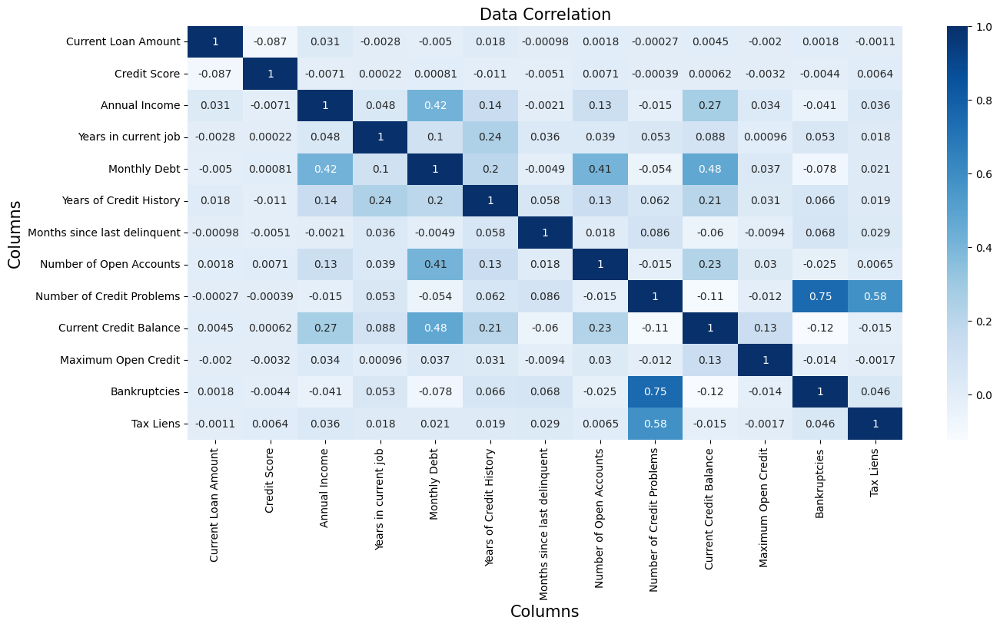

In [ ]:
import seaborn as sns
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True,cmap="Blues")
plt.title("Data Correlation",size=15)
plt.ylabel("Columns",size=15)
plt.xlabel("Columns",size=15)
plt.show()

Pre-processing/cleaning 6 : Removing dependent columns and manipulating columns
Since number of credit problem is directly prop to bankcrupcies, we can drop bankrupcies
Also we can merge Maximum open credit and Current Creddit Balance into one column by calculating the porportion of credit used

<ipython-input-25-f7b0afe81e35>:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True,cmap="Blues")


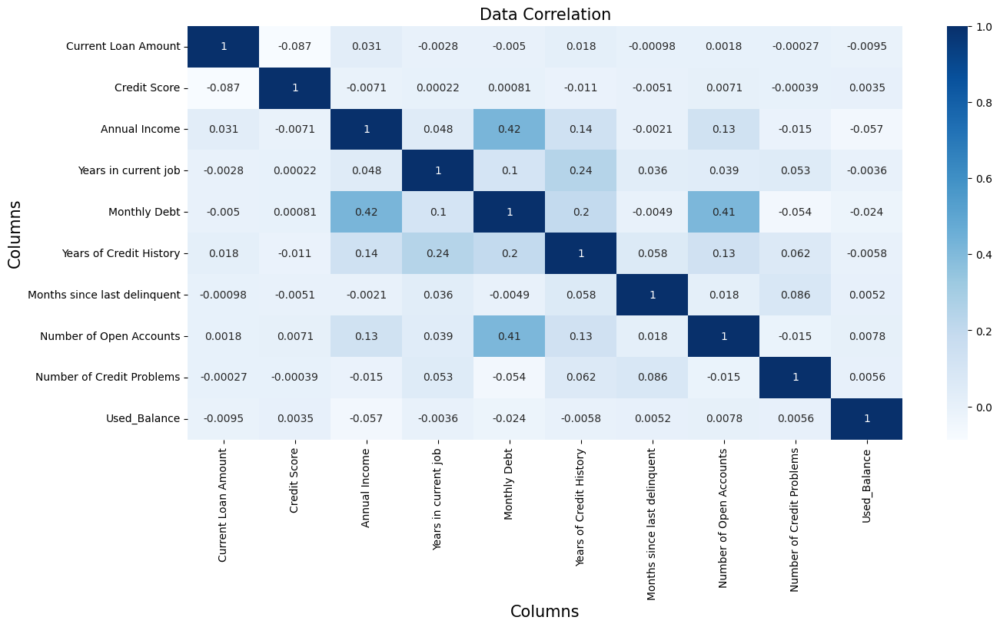

In [ ]:
df["Used_Balance"] = (df["Maximum Open Credit"] - df["Current Credit Balance"]) /  (df["Maximum Open Credit"] + 1)
df.drop(columns=["Bankruptcies", "Maximum Open Credit", "Current Credit Balance", "Tax Liens"], inplace=True)



plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True,cmap="Blues")
plt.title("Data Correlation",size=15)
plt.ylabel("Columns",size=15)
plt.xlabel("Columns",size=15)
plt.show()

# EDA, Data Distribution

EDA 10 : Data Distribution before removing outliers or standardizing data

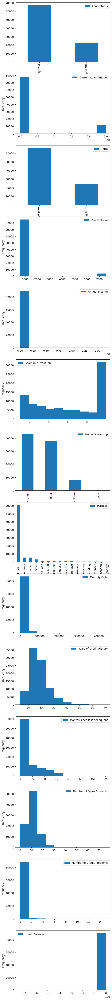

In [ ]:
n, m = df.shape
figsize = plt.rcParams.get("figure.figsize")
fig, ax = plt.subplots(nrows=m,figsize=(figsize[0],figsize[1]*m))
for i, x in enumerate(df):
  d = df[x]
  if d.dtypes == "O":
    d.value_counts().plot.bar(ax=ax[i], legend=True)
  else:
    d.plot.hist(ax=ax[i], legend=True)

In [ ]:
df[df[["Credit Score", "Loan Status"]].apply(lambda x: x[0] > 850, axis=1)][["Loan Status"]].value_counts()

Loan Status
Charged Off    4551
dtype: int64

In [ ]:
df[df[["Credit Score", "Loan Status"]].apply(lambda x: x[0] < 600, axis=1)][["Loan Status"]].value_counts()

Loan Status
Fully Paid     84
Charged Off    54
dtype: int64

In [ ]:
df["Credit Score"] = df["Credit Score"].apply(lambda x: min(x, 850))

In [ ]:
df

,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance
0,Fully Paid,445412.0,Short Term,709.0,1167493.0,8.0,Home Mortgage,Home Improvements,5214.74,17.2,12.769231,6.0,1.0,0.452447
1,Fully Paid,262328.0,Short Term,724.0,1174162.0,10.0,Home Mortgage,Debt Consolidation,33295.98,21.1,8.000000,35.0,0.0,0.729688
2,Fully Paid,99999999.0,Short Term,741.0,2231892.0,8.0,Own Home,Debt Consolidation,29200.53,14.9,29.000000,18.0,1.0,0.602719
3,Fully Paid,347666.0,Long Term,721.0,806949.0,3.0,Own Home,Debt Consolidation,8741.90,12.0,12.769231,9.0,0.0,0.337578
4,Fully Paid,176220.0,Short Term,724.0,1174162.0,5.0,Rent,Debt Consolidation,20639.70,6.1,12.769231,15.0,0.0,0.406658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,Fully Paid,210584.0,Short Term,719.0,783389.0,1.0,Home Mortgage,Other,3727.61,17.4,18.000000,6.0,0.0,0.998237
99996,Fully Paid,99999999.0,Short Term,732.0,1289416.0,1.0,Rent,Debt Consolidation,13109.05,9.4,21.000000,22.0,0.0,0.699459
99997,Fully Paid,103136.0,Short Term,742.0,1150545.0,6.0,Rent,Debt Consolidation,7315.57,18.8,18.000000,12.0,1.0,0.796195
99998,Fully Paid,530332.0,Short Term,746.0,1717524.0,9.0,Rent,Debt Consolidation,9890.07,15.0,12.769231,8.0,0.0,0.452457


In [ ]:
df.columns

Index(['Loan Status', 'Current Loan Amount', 'Term', 'Credit Score',
       'Annual Income', 'Years in current job', 'Home Ownership', 'Purpose',
       'Monthly Debt', 'Years of Credit History',
       'Months since last delinquent', 'Number of Open Accounts',
       'Number of Credit Problems', 'Used_Balance'],
      dtype='object')

Pre-processing/cleaning 7 : Performing outliers removal operation. Outliers effect our models such as linear regression. It's better to either remove it or use median/mean/mode for it. We are removing them

In [ ]:
# USING IQR for removing outliers

df_outlier_cleaned = df.copy()
for i, x in enumerate(df):
  if x == 'Credit Score':
    continue
  d = df_outlier_cleaned[x]
  if d.dtypes != "O":
    if d.value_counts().shape[0] < 20:
      continue
    q3, q1 = np.percentile(d, [75, 25])
    IQR = q3 - q1

    upper_bound = q3 + 2 * IQR
    lower_bound = q1 - 2 * IQR
    df_outlier_cleaned = df_outlier_cleaned[d < upper_bound]
    df_outlier_cleaned = df_outlier_cleaned[d > lower_bound]

<ipython-input-33-2a65219344a7>:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_outlier_cleaned = df_outlier_cleaned[d > lower_bound]
<ipython-input-33-2a65219344a7>:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_outlier_cleaned = df_outlier_cleaned[d > lower_bound]
<ipython-input-33-2a65219344a7>:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_outlier_cleaned = df_outlier_cleaned[d > lower_bound]
<ipython-input-33-2a65219344a7>:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_outlier_cleaned = df_outlier_cleaned[d > lower_bound]
<ipython-input-33-2a65219344a7>:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_outlier_cleaned = df_outlier_cleaned[d > lower_bound]
<ipython-input-33-2a65219344a7>:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_outlier_cleaned = df_outlier

In [ ]:
df_outlier_cleaned.head()

,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance
0,Fully Paid,445412.0,Short Term,709.0,1167493.0,8.0,Home Mortgage,Home Improvements,5214.74,17.2,12.769231,6.0,1.0,0.452447
3,Fully Paid,347666.0,Long Term,721.0,806949.0,3.0,Own Home,Debt Consolidation,8741.90,12.0,12.769231,9.0,0.0,0.337578
4,Fully Paid,176220.0,Short Term,724.0,1174162.0,5.0,Rent,Debt Consolidation,20639.70,6.1,12.769231,15.0,0.0,0.406658
5,Charged Off,206602.0,Short Term,850.0,896857.0,10.0,Home Mortgage,Debt Consolidation,16367.74,17.3,12.769231,6.0,0.0,0.209727
6,Fully Paid,217646.0,Short Term,730.0,1184194.0,1.0,Home Mortgage,Debt Consolidation,10855.08,19.6,10.000000,13.0,1.0,0.550929


Pre-processing/cleaning 8 : Converting the Continous data of Credit Score to Categorical Data, Credit Quality.

In [ ]:
# 8 Processing, Conversion of continous data to Categorical Data
# Credit Score is mostly used to check the quality, 810 and 840 means the same in real world
def get_credit_quality(score):
  if score>=840:
    return "Fraudulent" 
  elif score>=800:
    return "Exceptional"
  elif score >=740:
    return "Very Good"
  elif score >= 670:
    return "Good"
  elif score >= 580:
    return "Average"
  else:
    return "Poor"
df_outlier_cleaned["Credit Quality"] = df_outlier_cleaned["Credit Score"].apply(lambda x: get_credit_quality(x))
df_outlier_cleaned.drop("Credit Score", axis=1, inplace=True)

EDA 11 : Visualizing Data distribution of Categorical Data after removing outliers

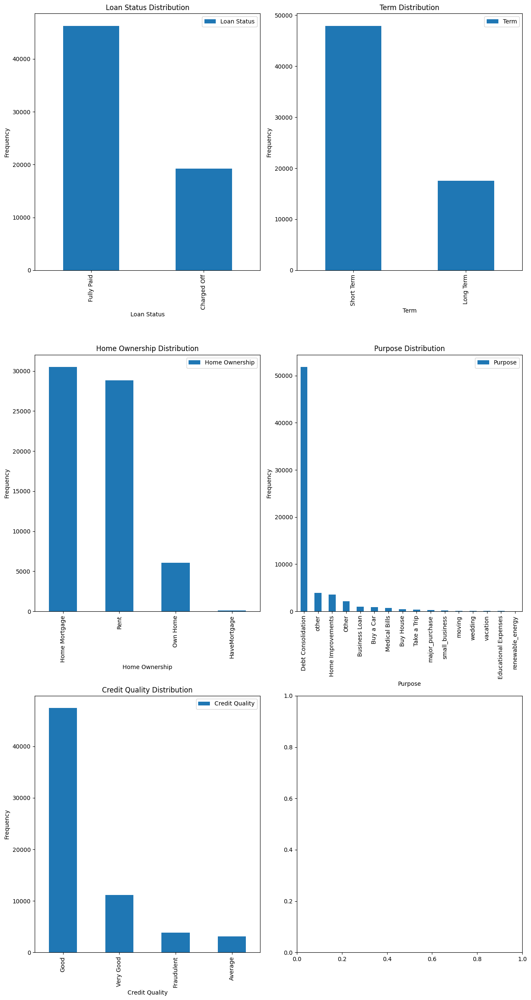

In [ ]:
n, m = df_outlier_cleaned.shape
figsize = plt.rcParams.get("figure.figsize")
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(figsize[0]*2,figsize[1]*5))
idx = 0
for i, x in enumerate(df_outlier_cleaned):
  d = df_outlier_cleaned[x]
  if d.dtypes == "O":
    ax[idx//2, idx%2].title.set_text(f'{x} Distribution')
    plot_fig = d.value_counts().plot.bar(ax=ax[idx//2, idx%2], legend=True)
    idx+=1
    plot_fig.set_xlabel(x, fontdict={"fontsize": 10})
    plot_fig.set_ylabel('Frequency', fontdict={"fontsize": 10})

fig.tight_layout()
plt.show()

EDA 11 : Visualizing Data distribution of Continuous Data after removing outliers

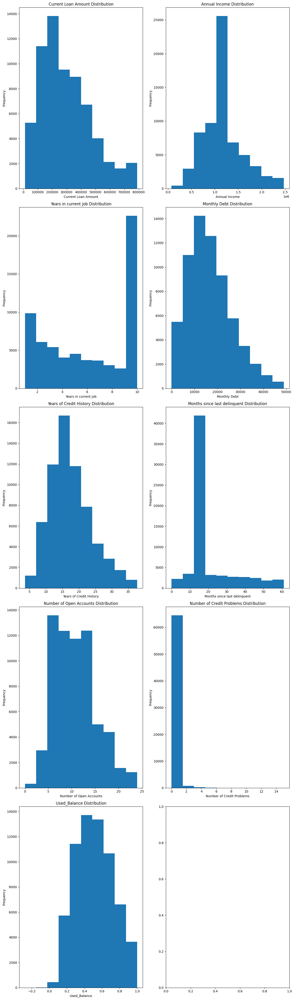

In [ ]:
n, m = df_outlier_cleaned.shape
figsize = plt.rcParams.get("figure.figsize")
fig, ax = plt.subplots(nrows=5, ncols= 2, figsize=(figsize[0]*2,figsize[1]*9))
idx = 0
for i, x in enumerate(df_outlier_cleaned):
  d = df_outlier_cleaned[x]
  if d.dtypes != "O":
    ax[idx//2, idx%2].title.set_text(f'{x} Distribution')
    plot_fig = d.plot.hist(ax=(ax[idx//2, idx%2]))
    plot_fig.set_xlabel(x, fontdict={"fontsize": 10})
    plot_fig.set_ylabel('Frequency', fontdict={"fontsize": 10})
    idx += 1
fig.tight_layout()
plt.show()

EDA 13 : Checking the distribution of different columns on the basis of loan status

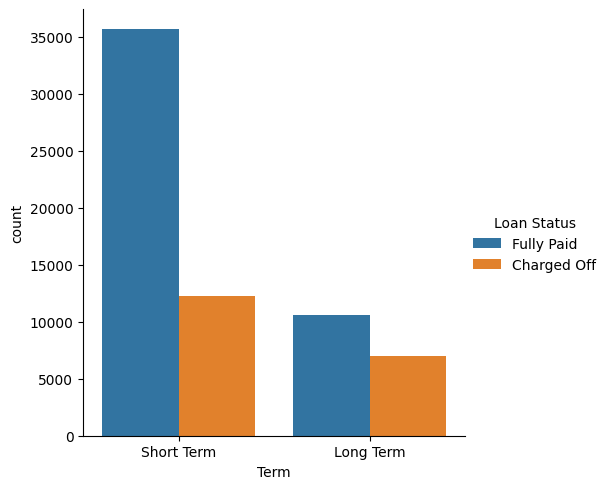

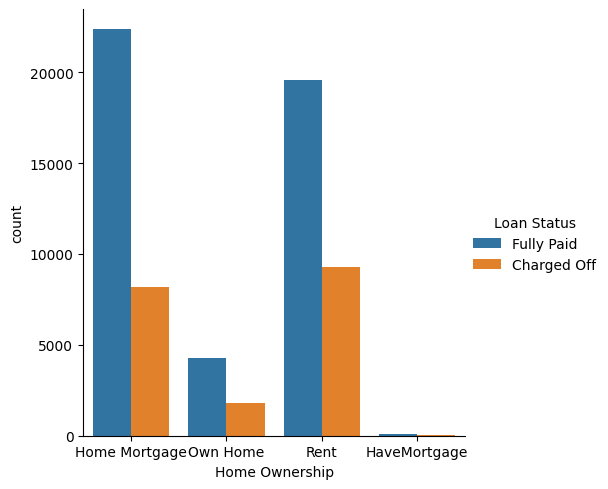

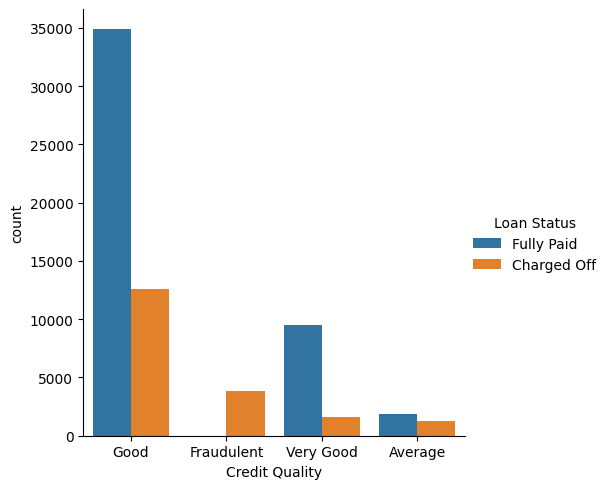

In [ ]:
for i, x in enumerate(df_outlier_cleaned):
  d = df_outlier_cleaned[x]
  if d.dtypes == "O" and x not in ["Loan Status", "Purpose"]:
      sns.catplot(data=df_outlier_cleaned[[x, "Loan Status"]],kind='count',x=x,hue='Loan Status')
fig.tight_layout()
plt.show()

In [ ]:
df_outlier_cleaned = df_outlier_cleaned[df_outlier_cleaned.groupby('Number of Credit Problems')["Number of Credit Problems"].transform('count')>50]
# df_outlier_cleaned = df_outlier_cleaned[df_outlier_cleaned.groupby('Bankruptcies')["Bankruptcies"].transform('count')>50]
# df_outlier_cleaned = df_outlier_cleaned[df_outlier_cleaned.groupby('Tax Liens')["Tax Liens"].transform('count')>50]

EDA 14 : Using BoxPlot to visualize & analyse the columns such as Number of 

---

Credit Problems", "Bankruptcies", "Tax Liens 

---



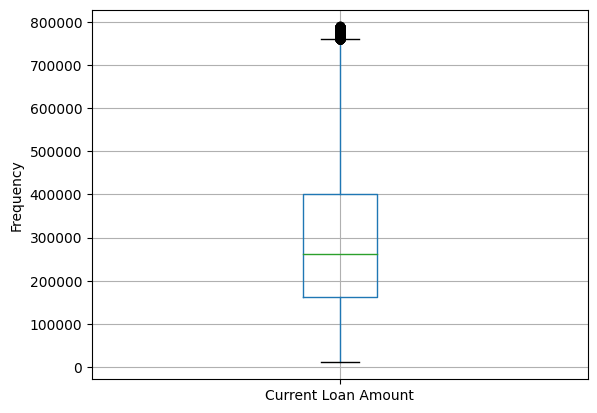

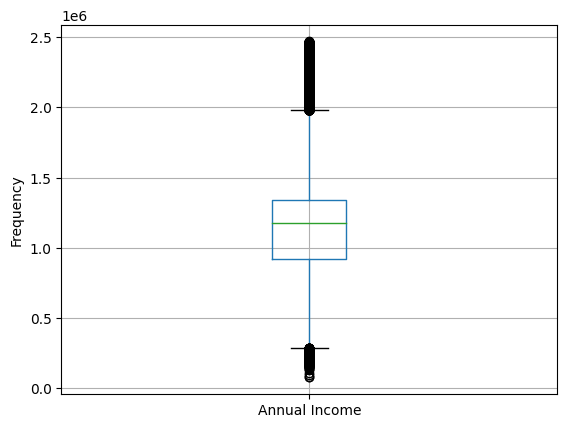

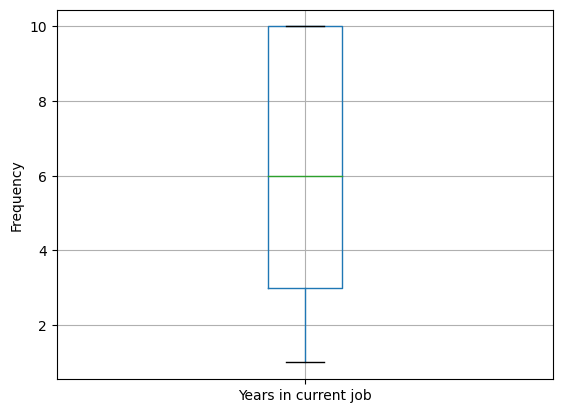

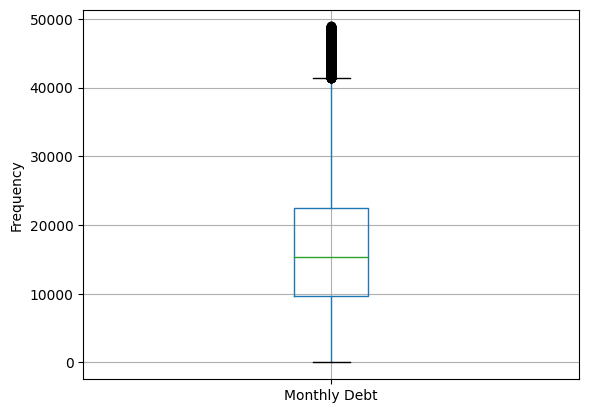

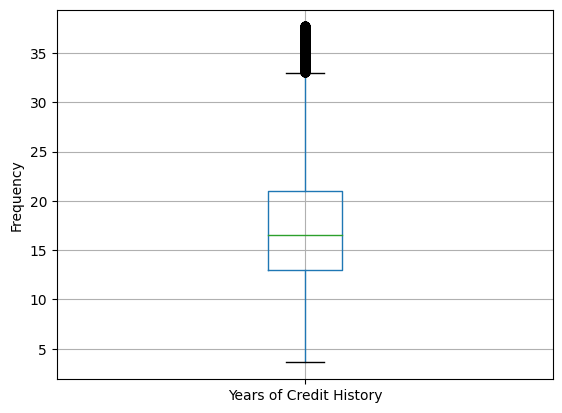

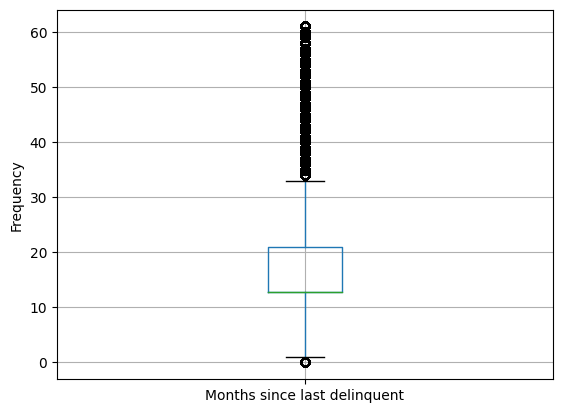

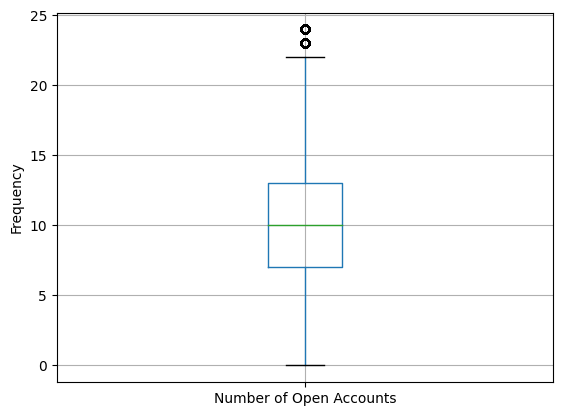

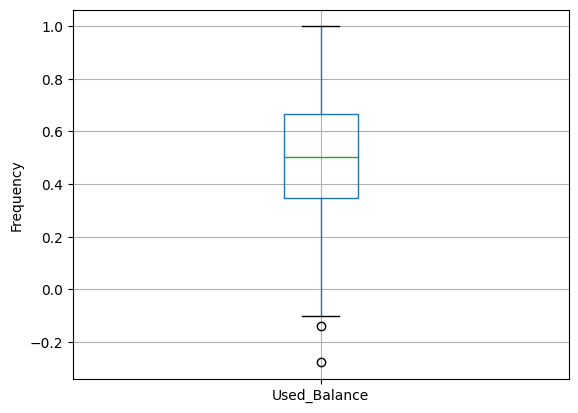

In [ ]:
df1=df_outlier_cleaned.select_dtypes(exclude=['object'])
for column in df1:
      if column in ["Number of Credit Problems", "Bankruptcies", "Tax Liens"]:
        continue
      plt.figure()
      ax = df1.boxplot([column])
      ax.set_ylabel('Frequency')


In [ ]:
df_outlier_cleaned

,Loan Status,Current Loan Amount,Term,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance,Credit Quality
0,Fully Paid,445412.0,Short Term,1167493.0,8.0,Home Mortgage,Home Improvements,5214.74,17.2,12.769231,6.0,1.0,0.452447,Good
3,Fully Paid,347666.0,Long Term,806949.0,3.0,Own Home,Debt Consolidation,8741.90,12.0,12.769231,9.0,0.0,0.337578,Good
4,Fully Paid,176220.0,Short Term,1174162.0,5.0,Rent,Debt Consolidation,20639.70,6.1,12.769231,15.0,0.0,0.406658,Good
5,Charged Off,206602.0,Short Term,896857.0,10.0,Home Mortgage,Debt Consolidation,16367.74,17.3,12.769231,6.0,0.0,0.209727,Fraudulent
6,Fully Paid,217646.0,Short Term,1184194.0,1.0,Home Mortgage,Debt Consolidation,10855.08,19.6,10.000000,13.0,1.0,0.550929,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99989,Charged Off,429132.0,Short Term,1174162.0,10.0,Home Mortgage,Debt Consolidation,28948.02,16.3,12.769231,16.0,0.0,0.260712,Good
99992,Fully Paid,48796.0,Short Term,1174162.0,4.0,Home Mortgage,major_purchase,8298.63,8.3,12.769231,9.0,0.0,0.632940,Good
99994,Fully Paid,210584.0,Short Term,783389.0,1.0,Home Mortgage,Other,3727.61,17.4,18.000000,6.0,0.0,0.998237,Good
99997,Fully Paid,103136.0,Short Term,1150545.0,6.0,Rent,Debt Consolidation,7315.57,18.8,18.000000,12.0,1.0,0.796195,Very Good


In [ ]:
df_outlier_cleaned

,Loan Status,Current Loan Amount,Term,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance,Credit Quality
0,Fully Paid,445412.0,Short Term,1167493.0,8.0,Home Mortgage,Home Improvements,5214.74,17.2,12.769231,6.0,1.0,0.452447,Good
3,Fully Paid,347666.0,Long Term,806949.0,3.0,Own Home,Debt Consolidation,8741.90,12.0,12.769231,9.0,0.0,0.337578,Good
4,Fully Paid,176220.0,Short Term,1174162.0,5.0,Rent,Debt Consolidation,20639.70,6.1,12.769231,15.0,0.0,0.406658,Good
5,Charged Off,206602.0,Short Term,896857.0,10.0,Home Mortgage,Debt Consolidation,16367.74,17.3,12.769231,6.0,0.0,0.209727,Fraudulent
6,Fully Paid,217646.0,Short Term,1184194.0,1.0,Home Mortgage,Debt Consolidation,10855.08,19.6,10.000000,13.0,1.0,0.550929,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99989,Charged Off,429132.0,Short Term,1174162.0,10.0,Home Mortgage,Debt Consolidation,28948.02,16.3,12.769231,16.0,0.0,0.260712,Good
99992,Fully Paid,48796.0,Short Term,1174162.0,4.0,Home Mortgage,major_purchase,8298.63,8.3,12.769231,9.0,0.0,0.632940,Good
99994,Fully Paid,210584.0,Short Term,783389.0,1.0,Home Mortgage,Other,3727.61,17.4,18.000000,6.0,0.0,0.998237,Good
99997,Fully Paid,103136.0,Short Term,1150545.0,6.0,Rent,Debt Consolidation,7315.57,18.8,18.000000,12.0,1.0,0.796195,Very Good


EDA 14 : checking and plotting the skewness values of our dataset to understand the distribution of the data and its impact on our analysis or modeling.

In [ ]:
continuous = df_outlier_cleaned.dtypes[df_outlier_cleaned.dtypes!="object"].index
df_outlier_cleaned[continuous].skew().sort_values(ascending=False)

Number of Credit Problems       3.424343
Months since last delinquent    1.636870
Current Loan Amount             0.814834
Monthly Debt                    0.703192
Years of Credit History         0.687157
Number of Open Accounts         0.622872
Annual Income                   0.608072
Used_Balance                    0.180654
Years in current job           -0.162413
dtype: float64

Text(0, 0.5, 'Frequency')

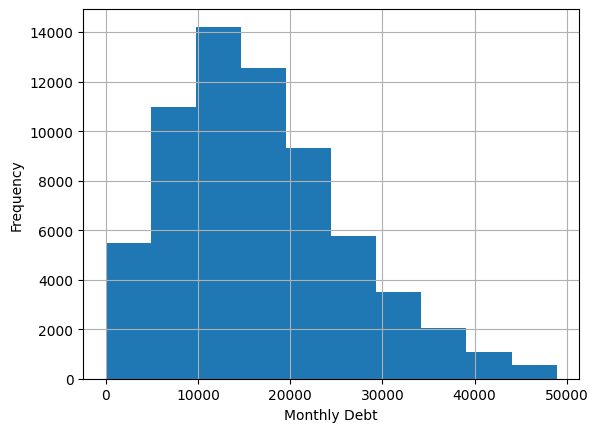

In [ ]:
axarr = df_outlier_cleaned["Monthly Debt"].hist()
axarr.set_xlabel("Monthly Debt")
axarr.set_ylabel("Frequency")

-0.6703988444384995 0.8148337395049242


Text(0, 0.5, 'Frequency')

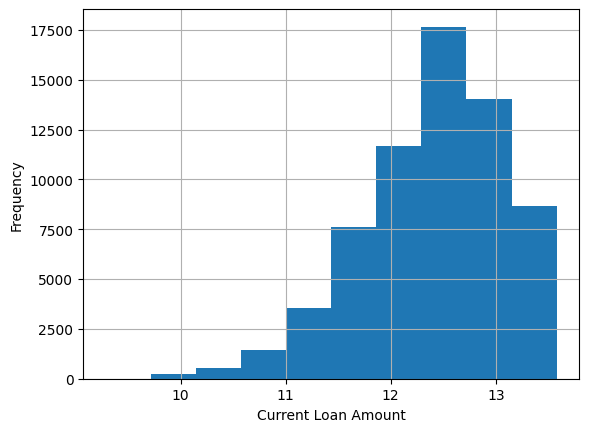

In [ ]:
normal_df = df_outlier_cleaned.copy()
normal_df["Current Loan Amount"] = np.log(df_outlier_cleaned["Current Loan Amount"])
print(normal_df["Current Loan Amount"].skew(), df_outlier_cleaned["Current Loan Amount"].skew())
axarr = normal_df["Current Loan Amount"].hist()
axarr.set_xlabel("Current Loan Amount")
axarr.set_ylabel("Frequency")

Pre-processing/cleaning 9 : Converting skewed data to normal distribution as Skewed data can lead to biased estimates, such as biased mean or standard deviation, and violate the assumption of normality in many statistical models. Converting the data to a normal distribution can help to reduce the effect of extreme values and make the data more symmetric around the mean.

-0.03676484432494156

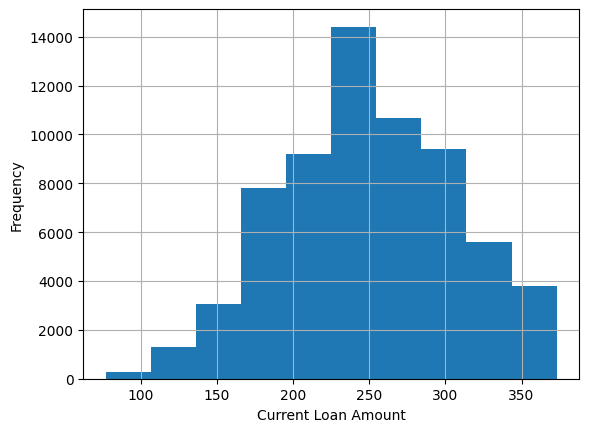

In [ ]:
normal_df["Current Loan Amount"], _ = scipy.stats.boxcox(df_outlier_cleaned["Current Loan Amount"])
axarr = normal_df["Current Loan Amount"].hist()
axarr.set_xlabel("Current Loan Amount")
axarr.set_ylabel("Frequency")
normal_df["Current Loan Amount"].skew()

0.608072321386958


<Axes: >

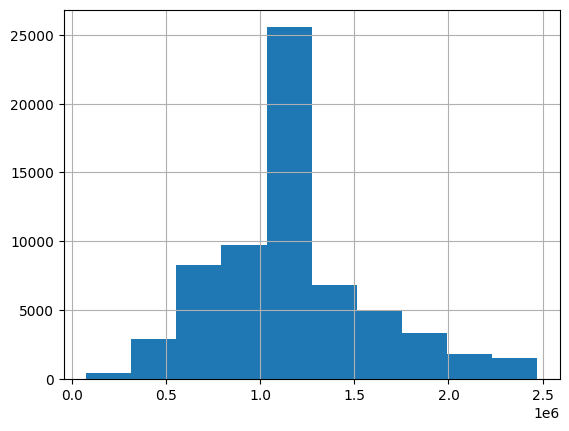

In [ ]:
print(df_outlier_cleaned["Annual Income"].skew())
df_outlier_cleaned["Annual Income"].hist()

0.024254794051715517

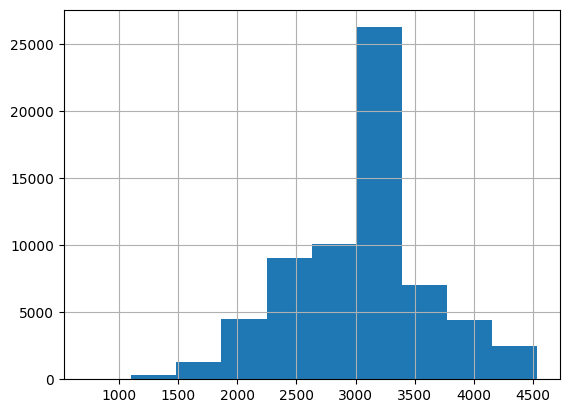

In [ ]:
normal_df["Annual Income"], _ = scipy.stats.boxcox(df_outlier_cleaned["Annual Income"])
normal_df["Annual Income"].hist()
normal_df["Annual Income"].skew()

0.7031930217045623

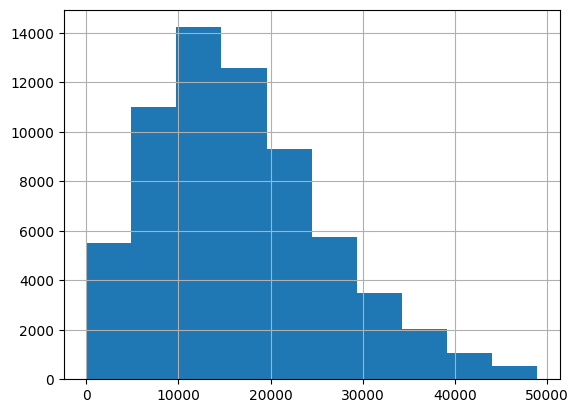

In [ ]:
df_outlier_cleaned["Monthly Debt"].replace(0, 1).hist()
df_outlier_cleaned["Monthly Debt"].replace(0, 1).skew()

<Axes: >

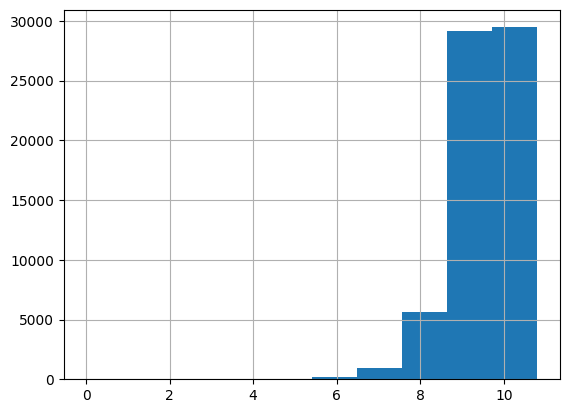

In [ ]:
normal_df["Monthly Debt"] = np.log(df_outlier_cleaned["Monthly Debt"].replace(0, 1))
normal_df["Monthly Debt"].hist()

-0.040342499247339424

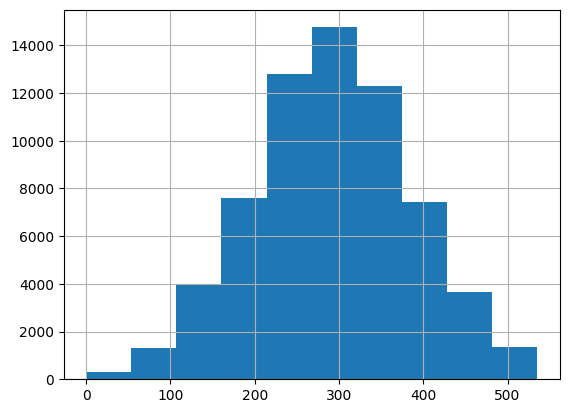

In [ ]:
normal_df["Monthly Debt"], _ = scipy.stats.boxcox(df_outlier_cleaned["Monthly Debt"].replace(0, 1))
normal_df["Monthly Debt"].hist()
normal_df["Monthly Debt"].skew()

1.636869597617596

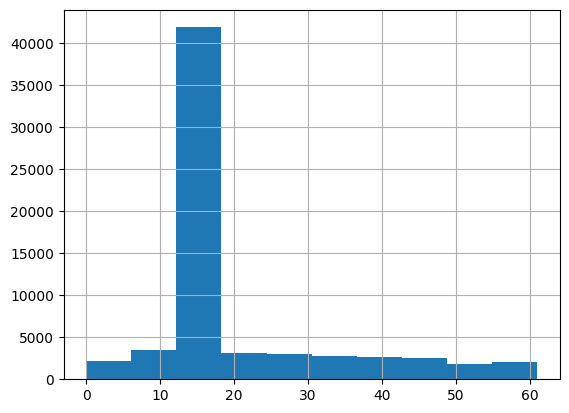

In [ ]:
df_outlier_cleaned["Months since last delinquent"].hist()
df_outlier_cleaned["Months since last delinquent"].skew()

-0.027974386419513317

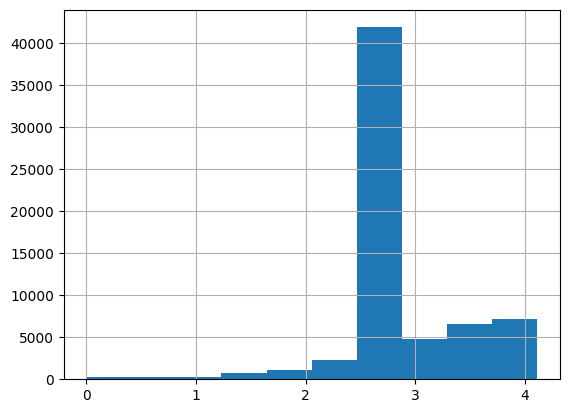

In [ ]:
normal_df["Months since last delinquent"] = np.log(df_outlier_cleaned["Months since last delinquent"].replace(0, 1))
normal_df["Months since last delinquent"].hist()
normal_df["Months since last delinquent"].skew()

0.18065416398372633

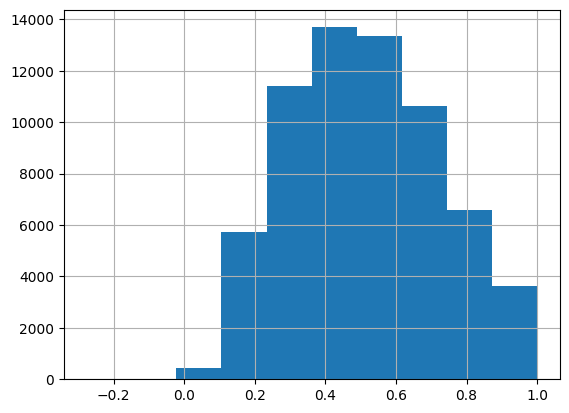

In [ ]:
df_outlier_cleaned["Used_Balance"].hist()
df_outlier_cleaned["Used_Balance"].skew()

In [ ]:
normal_df

,Loan Status,Current Loan Amount,Term,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance,Credit Quality
0,Fully Paid,302.779090,Short Term,3050.755128,8.0,Home Mortgage,Home Improvements,165.032261,17.2,2.547038,6.0,1.0,0.452447,Good
3,Fully Paid,276.585071,Long Term,2509.213054,3.0,Own Home,Debt Consolidation,216.705809,12.0,2.547038,9.0,0.0,0.337578,Good
4,Fully Paid,215.704777,Short Term,3059.962359,5.0,Rent,Debt Consolidation,340.403619,6.1,2.547038,15.0,0.0,0.406658,Good
5,Charged Off,228.644604,Short Term,2653.454678,10.0,Home Mortgage,Debt Consolidation,301.377957,17.3,2.547038,6.0,0.0,0.209727,Fraudulent
6,Fully Paid,233.045405,Short Term,3073.766259,1.0,Home Mortgage,Debt Consolidation,242.861213,19.6,2.302585,13.0,1.0,0.550929,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99989,Charged Off,298.690968,Short Term,3059.962359,10.0,Home Mortgage,Debt Consolidation,406.510913,16.3,2.547038,16.0,0.0,0.260712,Good
99992,Fully Paid,134.528354,Short Term,3059.962359,4.0,Home Mortgage,major_purchase,210.847785,8.3,2.547038,9.0,0.0,0.632940,Good
99994,Fully Paid,230.248274,Short Term,2470.178944,1.0,Home Mortgage,Other,138.197652,17.4,2.890372,6.0,0.0,0.998237,Good
99997,Fully Paid,177.217465,Short Term,3027.244524,6.0,Rent,Debt Consolidation,197.296528,18.8,2.890372,12.0,1.0,0.796195,Very Good


In [ ]:
# normal_df["Number of Credit Problems"] = normal_df["Number of Credit Problems"].astype(float)

In [ ]:
# normal_df["Number of Credit Problems"]

In [ ]:
loan_map = {"Charged Off": 0, "Fully Paid": 1}
revesrse_map = {0: "Charged Off", 1: "Fully Paid"}
normal_df["Loan Status"] = normal_df["Loan Status"].apply(lambda x: loan_map[x])

In [ ]:

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(normal_df.drop("Loan Status", axis=1), normal_df[["Loan Status"]], test_size=0.2, random_state=25)


In [ ]:
# train_X = normal_df.drop("Loan Status", axis=1)
# train_Y = training_data[["Loan Status"]]

In [ ]:
# from imblearn.under_sampling import RandomUnderSampler
# cc = RandomUnderSampler(random_state=0)
# X_undersample, y_undersample = cc.fit_resample(X_train, y_train)

In [ ]:
# y_undersample.value_counts()

In [ ]:

y_train.value_counts()

Loan Status
1              36869
0              15513
dtype: int64

In [ ]:
from imblearn.over_sampling import SMOTENC
over_sampler = SMOTENC(k_neighbors=2, categorical_features=[1, 4, 5, 12])
X_oversample, y_oversample = over_sampler.fit_resample(X_train, y_train)

In [ ]:
print(y_oversample.value_counts())
print(y_train.value_counts())

Loan Status
0              36869
1              36869
dtype: int64
Loan Status
1              36869
0              15513
dtype: int64


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import StandardScaler,LabelBinarizer, OrdinalEncoder

categorical_columns= ["Term", "Purpose", "Home Ownership", "Credit Quality"] # "Loan Status"
numeric_columns= [col for col in X_train.columns if col not in categorical_columns]

preprocessor=ColumnTransformer([
    ('num',StandardScaler(),numeric_columns),
    ('cat',OrdinalEncoder(),categorical_columns),
])

# clf_lr = Pipeline(
#     [("preprocessor", preprocessor), ("classifier", LogisticRegression())]
# )

# clf_lr.fit(X_train, y_train)

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, make_scorer, f1_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import seaborn as sns
import matplotlib.pyplot as plt
import time

def model_test(model, x_test, y_test):
  y_pred = model.predict(x_test)
  cf_matrix = confusion_matrix(y_test, y_pred)
  print("Model Score:", model.score(x_test, y_test))
  print("Classification Report:\n", classification_report(y_test, y_pred))
  print("Confusion Matrix\n")
  group_names = ["True Neg", "False Pos", "False Neg", "True Pos"]
  group_counts = ["{0:0.0f}".format(value) for value in
                  cf_matrix.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in
                      cf_matrix.flatten()/np.sum(cf_matrix)]
  labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
            zip(group_names,group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(2,2)
  sns.heatmap(cf_matrix, xticklabels=["Charged Off", "Fully Paid"], yticklabels=["Charged Off", "Fully Paid"], annot=labels, fmt="", cmap='Blues')
  plt.show()



def train_model(model, x_train, y_train, x_test, y_test, **params):
  preprocessor=ColumnTransformer([
      ('num',StandardScaler(),numeric_columns),
      ('cat',OrdinalEncoder(),categorical_columns),
  ])

  clf = Pipeline(
      [("preprocessor", preprocessor), ("classifier", model(**params))]
  )

  clf.fit(x_train, y_train)

  model_test(clf, x_test, y_test)
  return clf



In [ ]:
from sklearn import pipeline
def grid_search_custom(model, x_train, y_train, gs_params, search_type=GridSearchCV, cv=5, **params):
  preprocessor=ColumnTransformer([
      ('num',StandardScaler(),numeric_columns),
      ('cat',OrdinalEncoder(),categorical_columns),
  ])

  pipeline = Pipeline(
      [("preprocessor", preprocessor), ("classifier", model(**params))]
  )
  scoring = make_scorer(f1_score)
  if search_type == RandomizedSearchCV:
    grid_type = {"param_distributions": gs_params}
  else:
    grid_type = {"param_grid": gs_params}

  gs_model = search_type(pipeline,
                         scoring=scoring,
                         n_jobs=-1,
                         verbose=10,
                         cv=cv,
                         **grid_type
                        )


  gs_model.fit(x_train, y_train)

  return gs_model


In [ ]:
def plot_custom_roc_curve(**algos):
  random_probs = [0 for _ in range(len(y_test))]
  random_auc = roc_auc_score(y_test, random_probs)
  ns_fpr, ns_tpr, _ = roc_curve(y_test, random_probs)
  print('Random: ROC AUC=%.3f' % (random_auc))
  plt.plot(ns_fpr, ns_tpr, linestyle='--', label='Random')
  for alg in algos:
    # predict probabilities
    probs = algos[alg].predict_proba(X_test)
    # keep probabilities for the positive outcome only
    probs = probs[:, 1]
    # calculate scores
    auc = roc_auc_score(y_test, probs)
    # summarize scores
    print(f'{alg}: ROC AUC=%.3f' % (auc))
    # calculate roc curves
    lr_fpr, lr_tpr, _ = roc_curve(y_test, probs)
    # plot the roc curve for the model
    plt.plot(lr_fpr, lr_tpr, marker='.', label=alg)
  # axis labels
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  # show the legend
  plt.legend()
  # show the plot
  plt.show()

Model Score: 0.6413408674404398
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.62      0.49      3718
           1       0.81      0.65      0.72      9378

    accuracy                           0.64     13096
   macro avg       0.61      0.63      0.61     13096
weighted avg       0.70      0.64      0.66     13096

Confusion Matrix



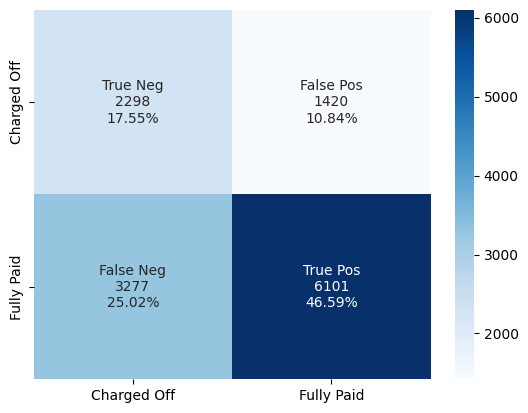

In [ ]:
lr_model = train_model(LogisticRegression, X_train, y_train, X_test, y_test, class_weight="balanced")

In [ ]:
# plot_custom_roc_curve(logistic=testing)

Model Score: 0.6385919364691509
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.62      0.49      3718
           1       0.81      0.65      0.72      9378

    accuracy                           0.64     13096
   macro avg       0.61      0.63      0.61     13096
weighted avg       0.70      0.64      0.65     13096

Confusion Matrix



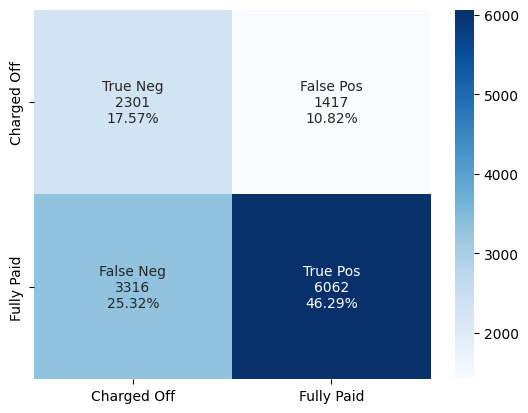

In [ ]:
lr_oversample = train_model(LogisticRegression, X_oversample, y_oversample, X_test, y_test, class_weight="balanced")

In [ ]:
lr_params = {"classifier__solver": ["lbfgs", "newton-cholesky", "saga"],
                 "classifier__penalty": ["l1", "l2"],
                 "classifier__C": np.logspace(-10, 10, 40),
                 "classifier__max_iter": [100, 200],
                 "classifier__warm_start": [True, False]
            }
lr_gridsearch = grid_search_custom(LogisticRegression, X_train, y_train, lr_params, class_weight="balanced")

In [ ]:
lr_gridsearch.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Current Loan Amount',
                                                   'Annual Income',
                                                   'Years in current job',
                                                   'Monthly Debt',
                                                   'Years of Credit History',
                                                   'Months since last '
                                                   'delinquent',
                                                   'Number of Open Accounts',
                                                   'Number of Credit Problems',
                                                   'Used_Balance']),
                                                 ('cat', OrdinalEncoder(),
                                                  ['Term', 'Purpose',
                                                   'Home Ownership',
                                                   'Credit Quality'])])),
                ('classifier',
                 LogisticRegression(C=0.00046415888336127724,
                                    class_weight='balanced', penalty='l1',
                                    solver='saga', warm_start=True))])

Model Score: 0.8518501016020036
Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.25      0.38      3718
           1       0.76      0.96      0.85      9378

    accuracy                           0.76     13096
   macro avg       0.74      0.61      0.61     13096
weighted avg       0.75      0.76      0.72     13096

Confusion Matrix



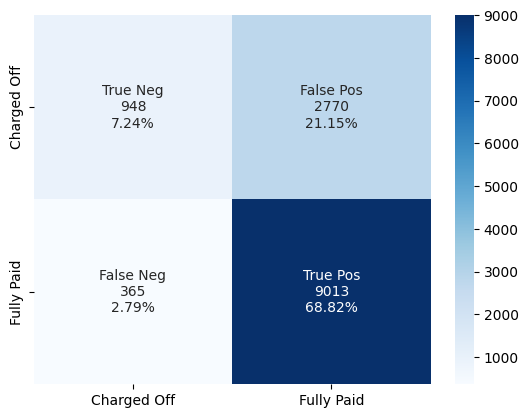

In [ ]:
model_test(lr_gridsearch, X_test, y_test)

Random: ROC AUC=0.500
logistic: ROC AUC=0.688
logistic_oversample: ROC AUC=0.688
best_fit_logistic: ROC AUC=0.658


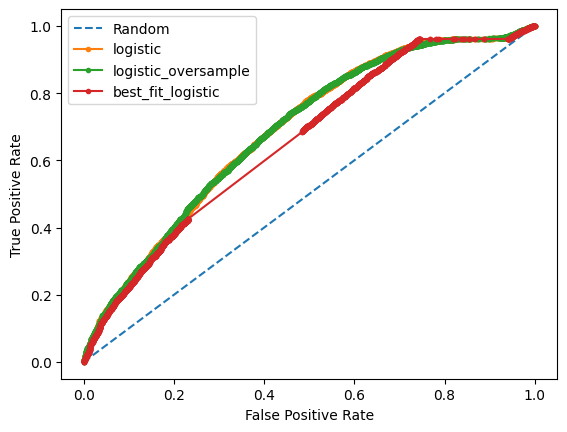

In [ ]:
plot_custom_roc_curve(logistic=lr_model, logistic_oversample=lr_oversample, best_fit_logistic=lr_gridsearch)

Model Score: 0.7364080635308491
Classification Report:
               precision    recall  f1-score   support

           0       0.59      0.23      0.33      3718
           1       0.75      0.94      0.84      9378

    accuracy                           0.74     13096
   macro avg       0.67      0.58      0.58     13096
weighted avg       0.71      0.74      0.69     13096

Confusion Matrix



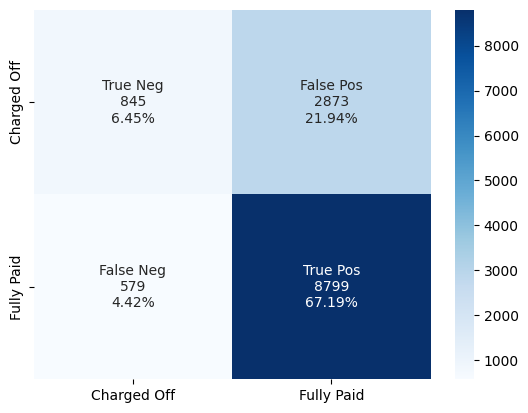

In [ ]:
from sklearn.naive_bayes import GaussianNB


nb_model = train_model(GaussianNB, X_train, y_train, X_test, y_test)


In [ ]:
nb_model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Current Loan Amount',
                                                   'Annual Income',
                                                   'Years in current job',
                                                   'Monthly Debt',
                                                   'Years of Credit History',
                                                   'Months since last '
                                                   'delinquent',
                                                   'Number of Open Accounts',
                                                   'Number of Credit Problems',
                                                   'Used_Balance']),
                                                 ('cat', OrdinalEncoder(),
                                                  ['Term', 'Purpose',
                                                   'Home Ownership',
                                                   'Credit Quality'])])),
                ('classifier', GaussianNB())])

Model Score: 0.660125229077581
Classification Report:
               precision    recall  f1-score   support

           0       0.42      0.53      0.47      3718
           1       0.79      0.71      0.75      9378

    accuracy                           0.66     13096
   macro avg       0.61      0.62      0.61     13096
weighted avg       0.69      0.66      0.67     13096

Confusion Matrix



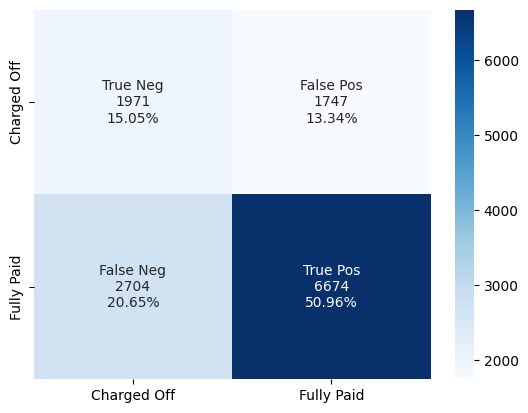

In [ ]:
nb_oversample = train_model(GaussianNB, X_oversample, y_oversample, X_test, y_test)

Random: ROC AUC=0.500
naive_baiyes: ROC AUC=0.681
naive_baiyes_oversample: ROC AUC=0.663


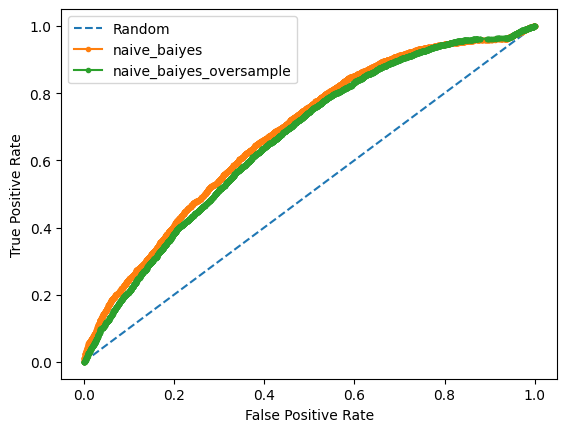

In [ ]:
plot_custom_roc_curve(naive_baiyes=nb_model, naive_baiyes_oversample=nb_oversample)

Model Score: 0.7472510690287111
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.20      0.31      3718
           1       0.75      0.97      0.85      9378

    accuracy                           0.75     13096
   macro avg       0.72      0.58      0.58     13096
weighted avg       0.74      0.75      0.69     13096

Confusion Matrix



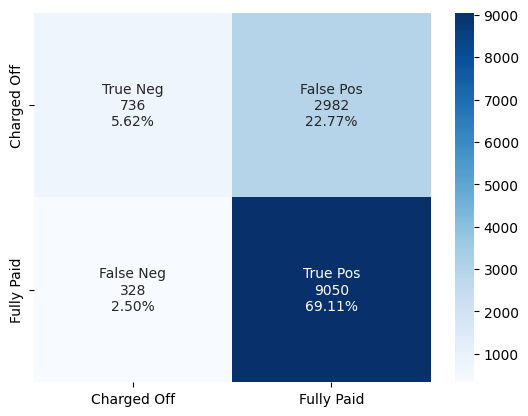

In [ ]:
from sklearn.svm import SVC

svc_model = train_model(SVC, X_train, y_train, X_test, y_test)


Model Score: 0.6734117287721442
Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.54      0.49      3718
           1       0.80      0.73      0.76      9378

    accuracy                           0.67     13096
   macro avg       0.62      0.63      0.62     13096
weighted avg       0.70      0.67      0.68     13096

Confusion Matrix



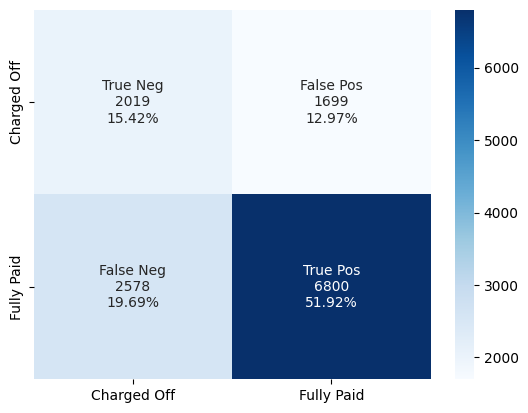

In [ ]:
svc_oversample = train_model(SVC, X_oversample, y_oversample, X_test, y_test)

In [ ]:
svc_params = {"classifier__C": [0.1, 1, 10],
              'classifier__kernel': ['rbf', 'poly']
            }
svc_gridsearch = grid_search_custom(SVC, X_train, y_train, svc_params, cv=2)

Fitting 2 folds for each of 6 candidates, totalling 12 fits


KeyboardInterrupt: ignored

In [ ]:
plot_custom_roc_curve(SVC=svc_model, SVC_oversample=svc_oversample, SVC_BEST=svc_gridsearch)

Model Score: 0.6587507635919365
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.44      0.42      3718
           1       0.77      0.74      0.76      9378

    accuracy                           0.66     13096
   macro avg       0.59      0.59      0.59     13096
weighted avg       0.67      0.66      0.66     13096

Confusion Matrix



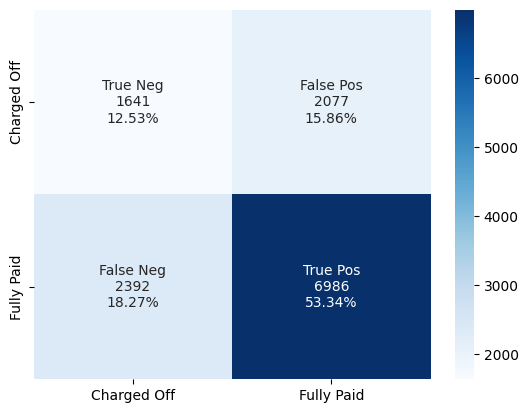

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt_model = train_model(DecisionTreeClassifier, X_train, y_train, X_test, y_test)

Model Score: 0.6545510079413561
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.47      0.43      3718
           1       0.77      0.73      0.75      9378

    accuracy                           0.65     13096
   macro avg       0.59      0.60      0.59     13096
weighted avg       0.67      0.65      0.66     13096

Confusion Matrix



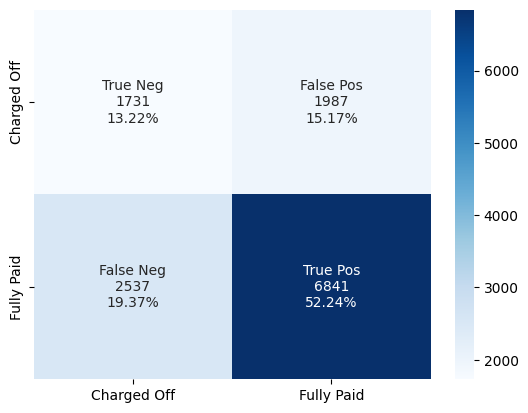

In [ ]:
dt_oversample = train_model(DecisionTreeClassifier, X_oversample, y_oversample, X_test, y_test)

In [ ]:
dt_params = {"classifier__max_depth": [10, 20, 30, 40],
                 "classifier__max_features": ['auto', 'sqrt'],
                 "classifier__min_samples_leaf": [1, 2, 4],
            }
decision_tree_gridsearch = grid_search_custom(DecisionTreeClassifier, X_train, y_train, dt_params, cv=2)

Fitting 2 folds for each of 24 candidates, totalling 48 fits


Model Score: 0.8477223833130669
Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.21      0.32      3718
           1       0.75      0.97      0.85      9378

    accuracy                           0.75     13096
   macro avg       0.73      0.59      0.59     13096
weighted avg       0.74      0.75      0.70     13096

Confusion Matrix



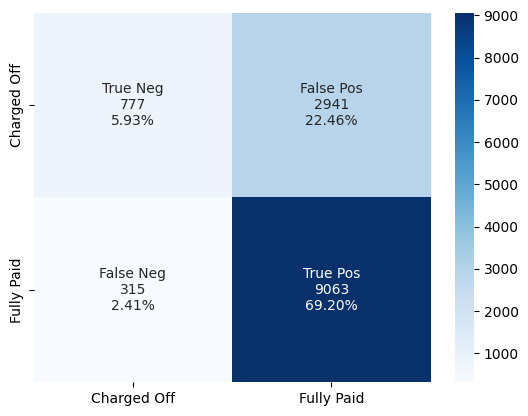

In [ ]:
model_test(decision_tree_gridsearch, X_test, y_test)

Random: ROC AUC=0.500
decision_tree: ROC AUC=0.593
decision_tree_oversample: ROC AUC=0.598
dt_best: ROC AUC=0.663


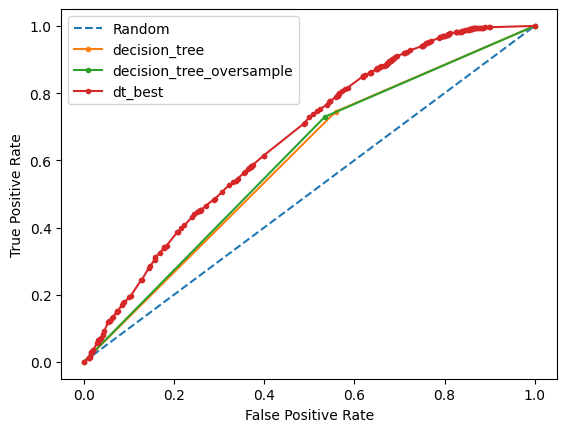

In [ ]:
plot_custom_roc_curve(decision_tree=dt_model, decision_tree_oversample=dt_oversample, dt_best=decision_tree_gridsearch)

In [ ]:
decision_tree_gridsearch.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Current Loan Amount',
                                                   'Annual Income',
                                                   'Years in current job',
                                                   'Monthly Debt',
                                                   'Years of Credit History',
                                                   'Months since last '
                                                   'delinquent',
                                                   'Number of Open Accounts',
                                                   'Number of Credit Problems',
                                                   'Used_Balance']),
                                                 ('cat', OrdinalEncoder(),
                                                  ['Term', 'Purpose',
                                                   'Home Ownership',
                                                   'Credit Quality'])])),
                ('classifier',
                 DecisionTreeClassifier(max_depth=10, max_features='auto',
                                        min_samples_leaf=4))])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.10673 to fit



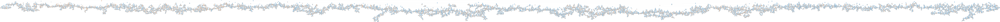

In [ ]:
from six import StringIO
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dt_model.named_steps["classifier"], out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


DecisionTreeClassifier()

Model Score: 0.7674098961514967
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.25      0.38      3718
           1       0.77      0.97      0.86      9378

    accuracy                           0.77     13096
   macro avg       0.77      0.61      0.62     13096
weighted avg       0.77      0.77      0.72     13096

Confusion Matrix



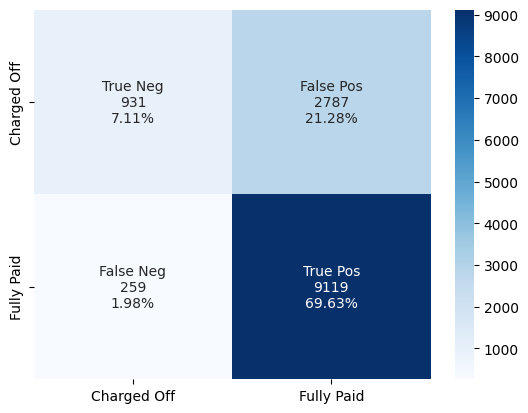

In [ ]:
from sklearn.ensemble import RandomForestClassifier


rf_model = train_model(RandomForestClassifier, X_train, y_train, X_test, y_test)


Model Score: 0.738317043372022
Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.38      0.45      3718
           1       0.78      0.88      0.83      9378

    accuracy                           0.74     13096
   macro avg       0.67      0.63      0.64     13096
weighted avg       0.72      0.74      0.72     13096

Confusion Matrix



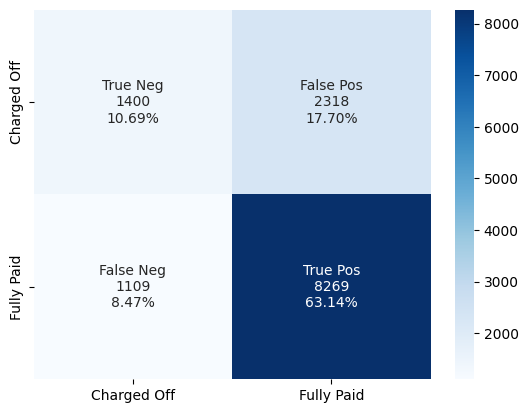

18.404707


In [ ]:
from datetime import datetime
start_time = datetime.now()
rf_oversample = train_model(RandomForestClassifier, X_oversample, y_oversample, X_test, y_test)
print((datetime.now() - start_time).total_seconds())

In [ ]:
rf_params = {"classifier__max_depth": [10, 20, 30],
             "classifier__min_samples_leaf": [1, 2, 4],
            "classifier__n_estimators": [200, 400, 600]
            }
rf_gridsearch = grid_search_custom(RandomForestClassifier, X_train, y_train, rf_params, search_type=RandomizedSearchCV, cv=2)

Fitting 2 folds for each of 10 candidates, totalling 20 fits


In [ ]:
rf_gridsearch.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Current Loan Amount',
                                                   'Annual Income',
                                                   'Years in current job',
                                                   'Monthly Debt',
                                                   'Years of Credit History',
                                                   'Months since last '
                                                   'delinquent',
                                                   'Number of Open Accounts',
                                                   'Number of Credit Problems',
                                                   'Used_Balance']),
                                                 ('cat', OrdinalEncoder(),
                                                  ['Term', 'Purpose',
                                                   'Home Ownership',
                                                   'Credit Quality'])])),
                ('classifier',
                 RandomForestClassifier(max_depth=10, min_samples_leaf=4,
                                        n_estimators=600))])

Model Score: 0.8610802811690714
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.21      0.34      3718
           1       0.76      0.99      0.86      9378

    accuracy                           0.77     13096
   macro avg       0.84      0.60      0.60     13096
weighted avg       0.81      0.77      0.71     13096

Confusion Matrix



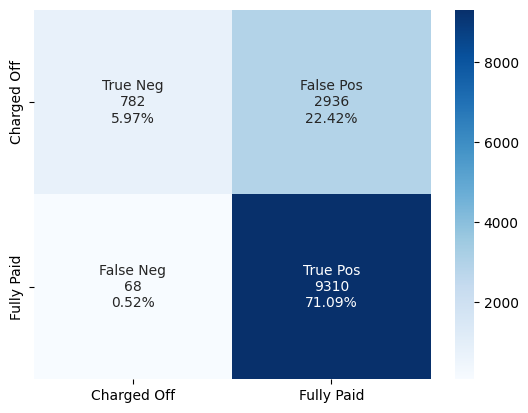

In [ ]:
model_test(rf_gridsearch, X_test, y_test)

Random: ROC AUC=0.500
Random_Forest: ROC AUC=0.703
RANDOM_FOREST_oversample: ROC AUC=0.701
RANDOM_FOREST_BEST: ROC AUC=0.706


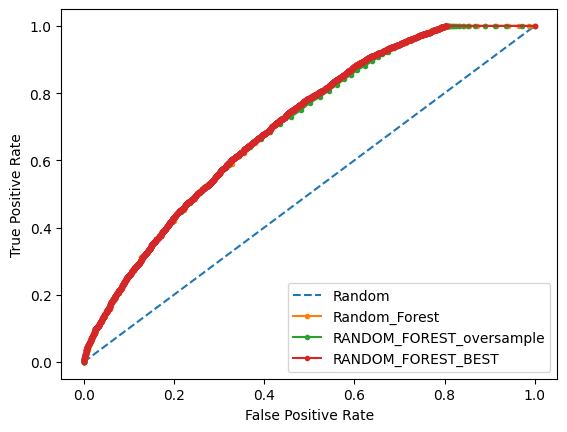

In [ ]:
plot_custom_roc_curve(Random_Forest=rf_model, RANDOM_FOREST_oversample=rf_oversample, RANDOM_FOREST_BEST=rf_gridsearch)

Model Score: 0.768020769700672
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.25      0.38      3718
           1       0.77      0.97      0.86      9378

    accuracy                           0.77     13096
   macro avg       0.77      0.61      0.62     13096
weighted avg       0.77      0.77      0.72     13096

Confusion Matrix



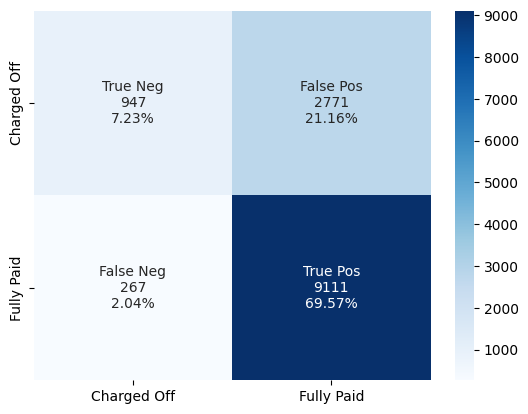

In [ ]:
from xgboost import XGBClassifier

xgb_model = train_model(XGBClassifier, X_train, y_train, X_test, y_test)


Model Score: 0.767944410507025
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.27      0.40      3718
           1       0.77      0.96      0.86      9378

    accuracy                           0.77     13096
   macro avg       0.76      0.62      0.63     13096
weighted avg       0.76      0.77      0.73     13096

Confusion Matrix



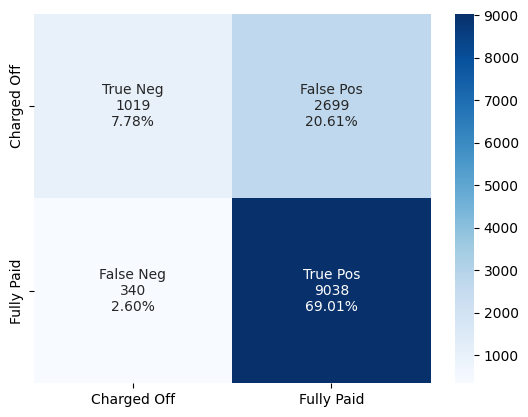

In [ ]:
xgb_oversample = train_model(XGBClassifier, X_oversample, y_oversample, X_test, y_test)

In [ ]:
xgboost_params = [
  {
    'classifier__n_estimators': [50, 100, 150],
    'classifier__learning_rate': [0.01, 0.1],
    'classifier__max_depth': [3, 4, 5, 6],
  }
]
xgb_gridsearch = grid_search_custom(XGBClassifier, X_train, y_train, xgboost_params, search_type=RandomizedSearchCV, cv=2)

Fitting 2 folds for each of 10 candidates, totalling 20 fits


In [ ]:
xgb_gridsearch.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Current Loan Amount',
                                                   'Annual Income',
                                                   'Years in current job',
                                                   'Monthly Debt',
                                                   'Years of Credit History',
                                                   'Months since last '
                                                   'delinquent',
                                                   'Number of Open Accounts',
                                                   'Number of Credit Problems',
                                                   'Used_Balance']),
                                                 ('cat', OrdinalEncoder(),
                                                  ['Term', 'Purpose',
                                                   'Home Ownership',
                                                   'Credit Quality']...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.01,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=3, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=150,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

Model Score: 0.8624637881087046
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.20      0.33      3718
           1       0.76      1.00      0.86      9378

    accuracy                           0.77     13096
   macro avg       0.88      0.60      0.59     13096
weighted avg       0.83      0.77      0.71     13096

Confusion Matrix



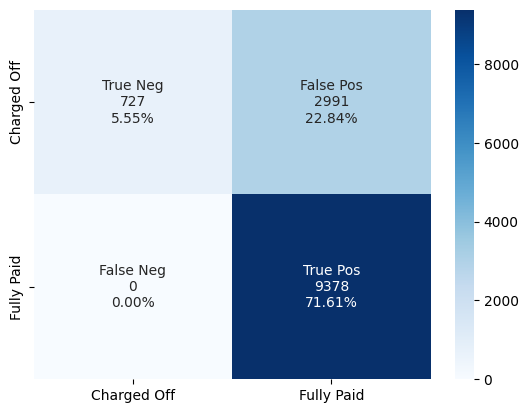

In [ ]:
model_test(xgb_gridsearch, X_test, y_test)

Random: ROC AUC=0.500
XGBClassifier: ROC AUC=0.697
xgb_oversample: ROC AUC=0.700
XGB_BEST: ROC AUC=0.691


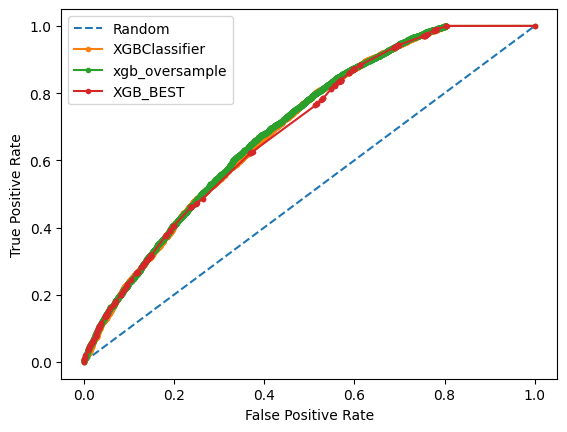

In [ ]:
plot_custom_roc_curve(XGBClassifier=xgb_model, xgb_oversample=xgb_oversample, XGB_BEST=xgb_gridsearch)

In [ ]:
# train_model(SVC, X_train, y_train, X_test, y_test, C=0.5)

/usr/local/lib/python3.9/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.7399969456322542
              precision    recall  f1-score   support

           0       0.66      0.17      0.27      3718
           1       0.75      0.97      0.84      9378

    accuracy                           0.74     13096
   macro avg       0.70      0.57      0.56     13096
weighted avg       0.72      0.74      0.68     13096



Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Current Loan Amount',
                                                   'Annual Income',
                                                   'Years in current job',
                                                   'Monthly Debt',
                                                   'Years of Credit History',
                                                   'Months since last '
                                                   'delinquent',
                                                   'Number of Open Accounts',
                                                   'Number of Credit Problems',
                                                   'Used_Balance']),
                                                 ('cat', OrdinalEncoder(),
                                                  ['Term', 'Purpose',
                                                   'Home Ownership',
                                                   'Credit Quality'])])),
                ('classifier', SVC(C=0.5))])

In [ ]:
df

,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance
0,Fully Paid,445412.0,Short Term,709.0,1167493.0,8.0,Home Mortgage,Home Improvements,5214.74,17.2,12.769231,6.0,1.0,0.452447
1,Fully Paid,262328.0,Short Term,724.0,1174162.0,10.0,Home Mortgage,Debt Consolidation,33295.98,21.1,8.000000,35.0,0.0,0.729688
2,Fully Paid,99999999.0,Short Term,741.0,2231892.0,8.0,Own Home,Debt Consolidation,29200.53,14.9,29.000000,18.0,1.0,0.602719
3,Fully Paid,347666.0,Long Term,721.0,806949.0,3.0,Own Home,Debt Consolidation,8741.90,12.0,12.769231,9.0,0.0,0.337578
4,Fully Paid,176220.0,Short Term,724.0,1174162.0,5.0,Rent,Debt Consolidation,20639.70,6.1,12.769231,15.0,0.0,0.406658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,Fully Paid,210584.0,Short Term,719.0,783389.0,1.0,Home Mortgage,Other,3727.61,17.4,18.000000,6.0,0.0,0.998237
99996,Fully Paid,99999999.0,Short Term,732.0,1289416.0,1.0,Rent,Debt Consolidation,13109.05,9.4,21.000000,22.0,0.0,0.699459
99997,Fully Paid,103136.0,Short Term,742.0,1150545.0,6.0,Rent,Debt Consolidation,7315.57,18.8,18.000000,12.0,1.0,0.796195
99998,Fully Paid,530332.0,Short Term,746.0,1717524.0,9.0,Rent,Debt Consolidation,9890.07,15.0,12.769231,8.0,0.0,0.452457


In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA()
preprocessor=ColumnTransformer([
    ('num',StandardScaler(),numeric_columns),
    ('cat',OrdinalEncoder(),categorical_columns),
])
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)
pca = PCA()
pca.fit(X_train_processed)

#Transforming x_train and x_test 
x_train_pca = pca.transform(X_train_processed)
x_test_pca = pca.transform(X_test_processed)

#Find number of components that explain predefined variance threshold
sum_variance, component_count = 0, 0
while sum_variance < 0.85:
    sum_variance += pca.explained_variance_ratio_[component_count]
    component_count += 1
    
print('Number of Principal Components that explain >=85% of Variance: ', component_count)
print('Total Variance Explained by '+str(component_count)+' components:', str(sum_variance*100)+'%')


Number of Principal Components that explain >=85% of Variance:  8
Total Variance Explained by 8 components: 85.80628863909875%


In [ ]:
import statsmodels.api as sm
from sklearn.metrics import accuracy_score


In [ ]:
pca = PCA(n_components=10)
pca.fit(X_train_processed)

#Transforming x_train and x_test 
x_train_pca = pca.transform(X_train_processed)
x_test_pca = pca.transform(X_test_processed)

#Add constant to x_train and x_test
x_train_pca_cst = sm.add_constant(x_train_pca)
x_test_pca_cst = sm.add_constant(x_test_pca)

#Training


In [ ]:
model = XGBClassifier(n_estimators=50, max_depth=4)
model.fit(x_train_pca_cst, y_train)

#Predict
y_pred_train = model.predict(x_train_pca_cst)
y_pred_test = model.predict(x_test_pca_cst)

#Perfromance Evaluation
train_score = accuracy_score(y_train, y_pred_train)*100
test_score = accuracy_score(y_test, y_pred_test)*100

print("Training Set Accuracy:",str(train_score)+'%')
print("Testing Set Accuracy:",str(test_score)+'%')

Training Set Accuracy: 72.43327860715513%
Testing Set Accuracy: 72.0219914477703%


In [ ]:
from sklearn.naive_bayes import GaussianNB

preprocessor=ColumnTransformer([
    ('num',StandardScaler(),numeric_columns),
    ('cat',OrdinalEncoder(),categorical_columns),
])

clf_nb = Pipeline(
    [("preprocessor", preprocessor), ("classifier", (GaussianNB()))]
)

clf_nb.fit(X_train, y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Current Loan Amount',
                                                   'Annual Income',
                                                   'Years in current job',
                                                   'Monthly Debt',
                                                   'Years of Credit History',
                                                   'Months since last '
                                                   'delinquent',
                                                   'Number of Open Accounts',
                                                   'Number of Credit Problems',
                                                   'Used_Balance']),
                                                 ('cat', OrdinalEncoder(),
                                                  ['Term', 'Purpose',
                                                   'Home Ownership',
                                                   'Credit Quality'])])),
                ('classifier', GaussianNB())])

In [ ]:
clf_nb.score(X_test, y_test)

0.7364080635308491

In [ ]:
print(classification_report(y_test, clf_nb.predict(X_test)))

              precision    recall  f1-score   support

           0       0.59      0.23      0.33      3718
           1       0.75      0.94      0.84      9378

    accuracy                           0.74     13096
   macro avg       0.67      0.58      0.58     13096
weighted avg       0.71      0.74      0.69     13096



In [ ]:
from sklearn.ensemble import RandomForestClassifier
preprocessor=ColumnTransformer([
    ('num',StandardScaler(),numeric_columns),
    ('cat',OrdinalEncoder(),categorical_columns),
])

clf_rf = Pipeline(
    [("preprocessor", preprocessor), ("classifier", (RandomForestClassifier(random_state=1, max_depth=18)))]
)

clf_rf.fit(X_train, y_train)


/usr/local/lib/python3.9/dist-packages/sklearn/pipeline.py:405: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self._final_estimator.fit(Xt, y, **fit_params_last_step)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Current Loan Amount',
                                                   'Annual Income',
                                                   'Years in current job',
                                                   'Monthly Debt',
                                                   'Years of Credit History',
                                                   'Months since last '
                                                   'delinquent',
                                                   'Number of Open Accounts',
                                                   'Number of Credit Problems',
                                                   'Used_Balance']),
                                                 ('cat', OrdinalEncoder(),
                                                  ['Term', 'Purpose',
                                                   'Home Ownership',
                                                   'Credit Quality'])])),
                ('classifier',
                 RandomForestClassifier(max_depth=18, random_state=1))])

In [ ]:
print("Score: ", clf_rf.score(X_test, y_test))
print("Classification Report:\n", classification_report(y_test, clf_rf.predict(X_test)))

NameError: ignored

In [ ]:
from imblearn.over_sampling import SMOTENC
over_sampler = SMOTENC(k_neighbors=2, categorical_features=[1, 4, 5, 12])
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
clf_rf = Pipeline(
    [("preprocessor", preprocessor), ("classifier", (RandomForestClassifier(random_state=1, max_depth=18)))]
)

clf_rf.fit(X_res, y_res)

In [ ]:
# X_train

,Current Loan Amount,Term,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance,Credit Quality
13329,325.534333,Long Term,2992.872950,1.0,Rent,Debt Consolidation,329.551491,21.8,2.547038,9.0,0.0,0.442084,Fraudulent
81070,193.403807,Short Term,2254.611285,1.0,Home Mortgage,Business Loan,187.578628,11.0,2.833213,8.0,0.0,0.624300,Good
30842,209.968448,Short Term,1586.529722,10.0,Rent,Debt Consolidation,178.965834,23.1,2.547038,11.0,1.0,0.719316,Very Good
80758,264.261289,Short Term,3059.962359,3.0,Rent,Debt Consolidation,178.620362,11.4,2.547038,7.0,1.0,0.536216,Good
11093,127.349499,Short Term,3001.358790,5.0,Rent,Other,238.305130,16.5,3.465736,4.0,0.0,0.607902,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...
98850,357.687484,Long Term,3335.264548,10.0,Home Mortgage,Debt Consolidation,465.847478,18.0,2.547038,7.0,0.0,0.189913,Average
37890,277.985727,Short Term,3870.018653,10.0,Rent,Other,407.870258,15.9,2.547038,19.0,0.0,0.467133,Good
9152,345.472733,Short Term,3253.087230,10.0,Home Mortgage,Debt Consolidation,428.204623,8.7,2.547038,8.0,0.0,0.167456,Good
35081,156.270277,Short Term,2114.522106,2.0,Own Home,Debt Consolidation,194.980632,21.6,2.547038,11.0,0.0,0.384176,Good


In [ ]:
categorical_columns

['Term', 'Purpose', 'Home Ownership', 'Credit Quality']

In [ ]:
print("Score: ", clf_rf.score(X_test, y_test))
print("Classification Report:\n", classification_report(y_test, clf_rf.predict(X_test)))

Score:  0.7421350030543677
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.37      0.45      3718
           1       0.78      0.89      0.83      9378

    accuracy                           0.74     13096
   macro avg       0.68      0.63      0.64     13096
weighted avg       0.72      0.74      0.72     13096



Pre-processing/cleaning 10 : converting text data to labels, so that we can do the modelling on our data

In [ ]:
# from sklearn.preprocessing import LabelEncoder

# le_loan_status = LabelEncoder()
# le_term = LabelEncoder()
# le_purpose = LabelEncoder()
# le_home = LabelEncoder()
# le_credit = LabelEncoder()

# normal_df['Loan Status'] = le_loan_status.fit_transform(normal_df['Loan Status'])
# normal_df['Term'] = le_term.fit_transform(normal_df['Term'])
# normal_df['Purpose'] = le_purpose.fit_transform(normal_df['Purpose'])
# normal_df['Home Ownership'] = le_home.fit_transform(normal_df['Home Ownership'])
# normal_df['Credit Quality'] = le_credit.fit_transform(normal_df['Credit Quality'])


In [ ]:
pd.DataFrame(new_X, columns=numeric_columns+categorical_columns)

,Current Loan Amount,Annual Income,Years in current job,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance,Loan Status,Term,Purpose,Home Ownership,Credit Quality
0,0.921329,0.057592,0.543318,-1.357149,-0.045256,-0.387706,-1.061447,1.988224,-0.285811,1.0,1.0,5.0,1.0,2.0
1,0.466479,-0.882714,-0.875611,-0.804447,-0.873419,-0.387706,-0.378939,-0.357408,-0.831186,1.0,0.0,3.0,2.0,2.0
2,-0.590685,0.073579,-0.308039,0.518627,-1.813065,-0.387706,0.986078,-0.357408,-0.503211,1.0,1.0,3.0,3.0,2.0
3,-0.365989,-0.632260,1.110890,0.101208,-0.029330,-0.387706,-1.061447,-0.357408,-1.438198,0.0,1.0,3.0,1.0,1.0
4,-0.289571,0.097548,-1.443183,-0.524689,0.336973,-0.801903,0.531073,1.988224,0.181764,1.0,1.0,3.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65473,0.850340,0.073579,1.110890,1.225713,-0.188592,-0.387706,1.213581,-0.357408,-1.196134,0.0,1.0,3.0,1.0,2.0
65474,-2.000283,0.073579,-0.591825,-0.867105,-1.462688,-0.387706,-0.378939,-0.357408,0.571134,1.0,1.0,9.0,1.0,2.0
65475,-0.338142,-0.950490,-1.443183,-1.644173,-0.013404,0.194031,-1.061447,-0.357408,2.305491,1.0,1.0,7.0,1.0,2.0
65476,-1.259003,0.016770,-0.024253,-1.012050,0.209563,0.194031,0.303570,1.988224,1.346238,1.0,1.0,3.0,3.0,3.0


Pre-processing/cleaning 11 : Standardizing the data, as seen during data distribution, different parameters have different scales. This can lead to bad models which are based on calculating the distances.

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(normal_df),columns = normal_df.columns)

In [ ]:
df_scaled

,Loan Status,Current Loan Amount,Term,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance,Credit Quality
0,0.644851,0.921329,0.605594,0.057592,0.543318,-1.015460,0.533198,-1.357149,-0.045256,-0.387706,-1.061447,1.988224,-0.285811,-0.024949
1,0.644851,0.466479,-1.651270,-0.882714,-0.875611,0.031203,-0.350199,-0.804447,-0.873419,-0.387706,-0.378939,-0.357408,-0.831186,-0.024949
2,0.644851,-0.590685,0.605594,0.073579,-0.308039,1.077865,-0.350199,0.518627,-1.813065,-0.387706,0.986078,-0.357408,-0.503211,-0.024949
3,-1.550747,-0.365989,0.605594,-0.632260,1.110890,-1.015460,-0.350199,0.101208,-0.029330,-0.387706,-1.061447,-0.357408,-1.438198,-1.570481
4,0.644851,-0.289571,0.605594,0.097548,-1.443183,-1.015460,-0.350199,-0.524689,0.336973,-0.801903,0.531073,1.988224,0.181764,-0.024949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65473,-1.550747,0.850340,0.605594,0.073579,1.110890,-1.015460,-0.350199,1.225713,-0.188592,-0.387706,1.213581,-0.357408,-1.196134,-0.024949
65474,0.644851,-2.000283,0.605594,0.073579,-0.591825,-1.015460,2.299994,-0.867105,-1.462688,-0.387706,-0.378939,-0.357408,0.571134,-0.024949
65475,0.644851,-0.338142,0.605594,-0.950490,-1.443183,-1.015460,1.416596,-1.644173,-0.013404,0.194031,-1.061447,-0.357408,2.305491,-0.024949
65476,0.644851,-1.259003,0.605594,0.016770,-0.024253,1.077865,-0.350199,-1.012050,0.209563,0.194031,0.303570,1.988224,1.346238,1.520582


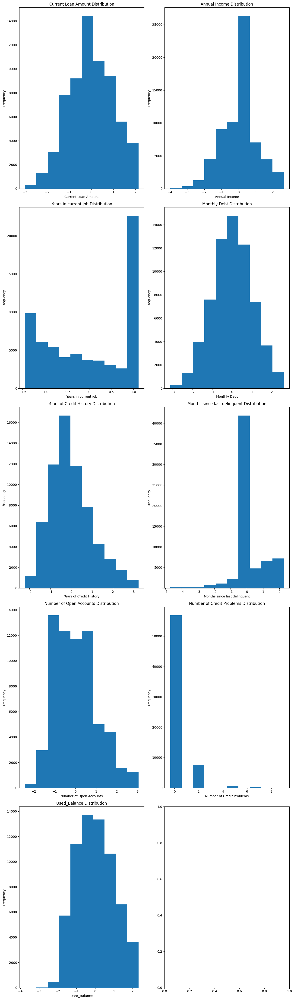

In [ ]:
from ast import Not
n, m = df_scaled.shape
figsize = plt.rcParams.get("figure.figsize")
fig, ax = plt.subplots(nrows=5, ncols= 2, figsize=(figsize[0]*2,figsize[1]*9))
idx = 0
for i, x in enumerate(df_scaled):
  d = df_scaled[x]
  if x not in ["Loan Status", "Term", "Purpose", "Home Ownership", "Credit Quality"]:
    ax[idx//2, idx%2].title.set_text(f'{x} Distribution')
    plot_fig = d.plot.hist(ax=(ax[idx//2, idx%2]))
    plot_fig.set_xlabel(x, fontdict={"fontsize": 10})
    plot_fig.set_ylabel('Frequency', fontdict={"fontsize": 10})
    idx += 1

  # else:
  #   print(x, "float")
  #   d.plot.hist(ax=ax[i], legend=True)
fig.tight_layout()
plt.show()

In [ ]:
df_scaled.shape

(65478, 14)

In [ ]:
df_scaled

,Loan Status,Current Loan Amount,Term,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Used_Balance,Credit Quality
0,0.644851,0.921329,0.605594,0.057592,0.543318,-1.015460,0.533198,-1.357149,-0.045256,-0.387706,-1.061447,1.988224,-0.285811,-0.024949
1,0.644851,0.466479,-1.651270,-0.882714,-0.875611,0.031203,-0.350199,-0.804447,-0.873419,-0.387706,-0.378939,-0.357408,-0.831186,-0.024949
2,0.644851,-0.590685,0.605594,0.073579,-0.308039,1.077865,-0.350199,0.518627,-1.813065,-0.387706,0.986078,-0.357408,-0.503211,-0.024949
3,-1.550747,-0.365989,0.605594,-0.632260,1.110890,-1.015460,-0.350199,0.101208,-0.029330,-0.387706,-1.061447,-0.357408,-1.438198,-1.570481
4,0.644851,-0.289571,0.605594,0.097548,-1.443183,-1.015460,-0.350199,-0.524689,0.336973,-0.801903,0.531073,1.988224,0.181764,-0.024949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65473,-1.550747,0.850340,0.605594,0.073579,1.110890,-1.015460,-0.350199,1.225713,-0.188592,-0.387706,1.213581,-0.357408,-1.196134,-0.024949
65474,0.644851,-2.000283,0.605594,0.073579,-0.591825,-1.015460,2.299994,-0.867105,-1.462688,-0.387706,-0.378939,-0.357408,0.571134,-0.024949
65475,0.644851,-0.338142,0.605594,-0.950490,-1.443183,-1.015460,1.416596,-1.644173,-0.013404,0.194031,-1.061447,-0.357408,2.305491,-0.024949
65476,0.644851,-1.259003,0.605594,0.016770,-0.024253,1.077865,-0.350199,-1.012050,0.209563,0.194031,0.303570,1.988224,1.346238,1.520582


In [ ]:
new_df  = pd.read_csv("drive/MyDrive/credit_train.csv")

In [ ]:
new_df.drop_duplicates(inplace=True)


In [ ]:
new_df

,Loan ID,Customer ID,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
0,14dd8831-6af5-400b-83ec-68e61888a048,981165ec-3274-42f5-a3b4-d104041a9ca9,Fully Paid,445412.0,Short Term,709.0,1167493.0,8 years,Home Mortgage,Home Improvements,5214.74,17.2,NaN,6.0,1.0,228190.0,416746.0,1.0,0.0
1,4771cc26-131a-45db-b5aa-537ea4ba5342,2de017a3-2e01-49cb-a581-08169e83be29,Fully Paid,262328.0,Short Term,NaN,NaN,10+ years,Home Mortgage,Debt Consolidation,33295.98,21.1,8.0,35.0,0.0,229976.0,850784.0,0.0,0.0
2,4eed4e6a-aa2f-4c91-8651-ce984ee8fb26,5efb2b2b-bf11-4dfd-a572-3761a2694725,Fully Paid,99999999.0,Short Term,741.0,2231892.0,8 years,Own Home,Debt Consolidation,29200.53,14.9,29.0,18.0,1.0,297996.0,750090.0,0.0,0.0
3,77598f7b-32e7-4e3b-a6e5-06ba0d98fe8a,e777faab-98ae-45af-9a86-7ce5b33b1011,Fully Paid,347666.0,Long Term,721.0,806949.0,3 years,Own Home,Debt Consolidation,8741.90,12.0,NaN,9.0,0.0,256329.0,386958.0,0.0,0.0
4,d4062e70-befa-4995-8643-a0de73938182,81536ad9-5ccf-4eb8-befb-47a4d608658e,Fully Paid,176220.0,Short Term,NaN,NaN,5 years,Rent,Debt Consolidation,20639.70,6.1,NaN,15.0,0.0,253460.0,427174.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99996,06eba04f-58fc-424a-b666-ed72aa008900,77f2252a-b7d1-4b07-a746-1202a8304290,Fully Paid,99999999.0,Short Term,732.0,1289416.0,1 year,Rent,Debt Consolidation,13109.05,9.4,21.0,22.0,0.0,153045.0,509234.0,0.0,0.0
99997,e1cb4050-eff5-4bdb-a1b0-aabd3f7eaac7,2ced5f10-bd60-4a11-9134-cadce4e7b0a3,Fully Paid,103136.0,Short Term,742.0,1150545.0,6 years,Rent,Debt Consolidation,7315.57,18.8,18.0,12.0,1.0,109554.0,537548.0,1.0,0.0
99998,81ab928b-d1a5-4523-9a3c-271ebb01b4fb,3e45ffda-99fd-4cfc-b8b8-446f4a505f36,Fully Paid,530332.0,Short Term,746.0,1717524.0,9 years,Rent,Debt Consolidation,9890.07,15.0,NaN,8.0,0.0,404225.0,738254.0,0.0,0.0
99999,c63916c6-6d46-47a9-949a-51d09af4414f,1b3014be-5c07-4d41-abe7-44573c375886,Fully Paid,99999999.0,Short Term,743.0,935180.0,NaN,Own Home,Debt Consolidation,9118.10,13.0,NaN,4.0,1.0,45600.0,91014.0,1.0,0.0


In [ ]:
new_df=new_df.drop(['Months since last delinquent','Loan ID','Customer ID'],axis=1)

In [ ]:
new_df=new_df.fillna(new_df.mean())

In [ ]:
new_df["Years in current job"] = new_df["Years in current job"].apply(lambda x: int(x.lower().strip("< + years")) if isinstance(x, (str)) else x)

In [ ]:
new_df['Years in current job'].fillna(5,inplace=True)

In [ ]:
new_df.dropna(inplace=True)

In [ ]:
new_df.describe()

,Current Loan Amount,Credit Score,Annual Income,Years in current job,Monthly Debt,Years of Credit History,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
count,8.978500e+04,89785.000000,8.978500e+04,89785.000000,89785.000000,89785.000000,89785.000000,89785.000000,8.978500e+04,8.978500e+04,89785.000000,89785.000000
mean,1.306089e+07,1130.830598,1.375894e+06,5.921078,18396.906410,18.248642,11.123250,0.164983,2.940351e+05,7.756565e+05,0.115531,0.028605
std,3.329556e+07,1393.418752,9.799392e+05,3.431037,12145.282372,7.034607,4.998884,0.478010,3.722277e+05,8.803419e+06,0.347551,0.255095
min,1.080200e+04,585.000000,7.662700e+04,1.000000,0.000000,3.600000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,1.802680e+05,715.000000,9.379350e+05,3.000000,10157.400000,13.500000,8.000000,0.000000,1.129360e+05,2.770680e+05,0.000000,0.000000
50%,3.138740e+05,737.000000,1.375894e+06,6.000000,16140.310000,17.000000,10.000000,0.000000,2.097220e+05,4.727140e+05,0.000000,0.000000
75%,5.323780e+05,1130.830598,1.495680e+06,10.000000,23918.910000,21.700000,14.000000,0.000000,3.675170e+05,7.914500e+05,0.000000,0.000000
max,1.000000e+08,7510.000000,1.655574e+08,10.000000,435843.280000,70.500000,76.000000,15.000000,3.287897e+07,1.539738e+09,7.000000,15.000000


In [ ]:
# USING IQR for removing outliers

df_outlier_cleaned = new_df.copy()
for i, x in enumerate(new_df):
  if x == 'Credit Score':
    continue
  d = df_outlier_cleaned[x]
  if d.dtypes != "O":
    if d.value_counts().shape[0] < 20:
      continue
    q3, q1 = np.percentile(d, [75, 25])
    IQR = q3 - q1

    upper_bound = q3 + 1.5 * IQR
    lower_bound = q1 - 1.5 * IQR
    df_outlier_cleaned = df_outlier_cleaned[d < upper_bound]
    df_outlier_cleaned = df_outlier_cleaned[d > lower_bound]
    

In [ ]:
from sklearn.preprocessing import LabelEncoder

loan_status_label_encoder = LabelEncoder()
df_outlier_cleaned['Loan Status'] = loan_status_label_encoder.fit_transform(df_outlier_cleaned['Loan Status'])

term_label_encoder = LabelEncoder()
df_outlier_cleaned['Term'] = term_label_encoder.fit_transform(df_outlier_cleaned['Term'])

home_label_encoder = LabelEncoder()
df_outlier_cleaned['Home Ownership'] = home_label_encoder.fit_transform(df_outlier_cleaned['Home Ownership'])

purpose_label_encoder = LabelEncoder()
df_outlier_cleaned['Purpose'] = home_label_encoder.fit_transform(df_outlier_cleaned['Purpose'])


# dummy=pd.get_dummies(df_train['purpose'],prefix='purpose')
# df_train=pd.concat([df_train,dummy],axis=1)
# df_train.drop(['purpose'],axis=1,inplace=True)


In [ ]:
from imblearn.over_sampling import SMOTE
x,y=SMOTE().fit_resample(df_outlier_cleaned.drop("Loan Status", axis=1), df_outlier_cleaned["Loan Status"])

1    42439
0    42439
Name: Loan Status, dtype: int64

In [ ]:
y

0        1
1        1
2        1
3        0
4        1
        ..
84873    0
84874    0
84875    0
84876    0
84877    0
Name: Loan Status, Length: 84878, dtype: int64

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import StandardScaler,LabelBinarizer, OrdinalEncoder


from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=25)




In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, make_scorer, f1_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt
import time

def model_test(model, x_test, y_test):
  y_pred = model.predict(x_test)
  cf_matrix = confusion_matrix(y_test, y_pred)
  print("Model Score:", model.score(x_test, y_test))
  print("Classification Report:\n", classification_report(y_test, y_pred))
  print("Confusion Matrix\n")
  group_names = ["True Neg", "False Pos", "False Neg", "True Pos"]
  group_counts = ["{0:0.0f}".format(value) for value in
                  cf_matrix.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in
                      cf_matrix.flatten()/np.sum(cf_matrix)]
  labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
            zip(group_names,group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(2,2)
  sns.heatmap(cf_matrix, xticklabels=["Charged Off", "Fully Paid"], yticklabels=["Charged Off", "Fully Paid"], annot=labels, fmt="", cmap='Blues')
  plt.show()



def train_model(model, x_train, y_train, x_test, y_test, **params):

  clf = Pipeline(
      [("standardscaler", StandardScaler()), ("classifier", model(**params))]
  )

  clf.fit(x_train, y_train)

  model_test(clf, x_test, y_test)
  return clf



In [ ]:
from xgboost import XGBClassifier

Model Score: 0.8209825636192272
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.69      0.79      8476
           1       0.75      0.95      0.84      8500

    accuracy                           0.82     16976
   macro avg       0.85      0.82      0.82     16976
weighted avg       0.85      0.82      0.82     16976

Confusion Matrix



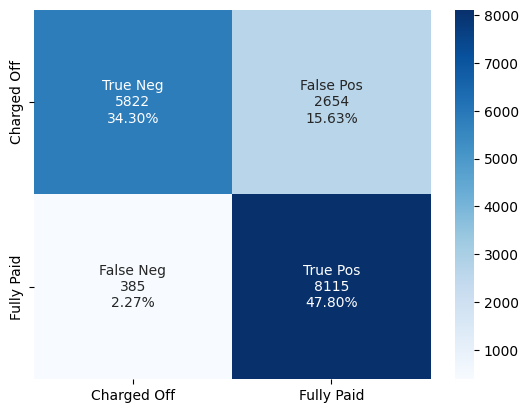

In [ ]:
pipeline = train_model(XGBClassifier, X_train, y_train, X_test, y_test)

In [ ]:
xg = pipeline["classifier"]

In [ ]:
xg.feature_importances_

array([0.00994834, 0.22643174, 0.18897676, 0.01613127, 0.17193873,
       0.01918785, 0.02422457, 0.01019118, 0.00869862, 0.07063138,
       0.17873989, 0.00992726, 0.0115801 , 0.04732462, 0.00606775],
      dtype=float32)

In [ ]:
feature_df=pd.DataFrame({'feature':X_train.columns,'importance':xg.feature_importances_})
feature_df.sort_values(by='importance',ascending=False).head(10)


,feature,importance
1,Term,0.226432
2,Credit Score,0.188977
10,Number of Credit Problems,0.178740
4,Years in current job,0.171939
9,Number of Open Accounts,0.070631
13,Bankruptcies,0.047325
6,Purpose,0.024225
5,Home Ownership,0.019188
3,Annual Income,0.016131
12,Maximum Open Credit,0.011580


Model Score: 0.8152097078228087
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.72      0.80      8476
           1       0.77      0.91      0.83      8500

    accuracy                           0.82     16976
   macro avg       0.83      0.82      0.81     16976
weighted avg       0.83      0.82      0.81     16976

Confusion Matrix



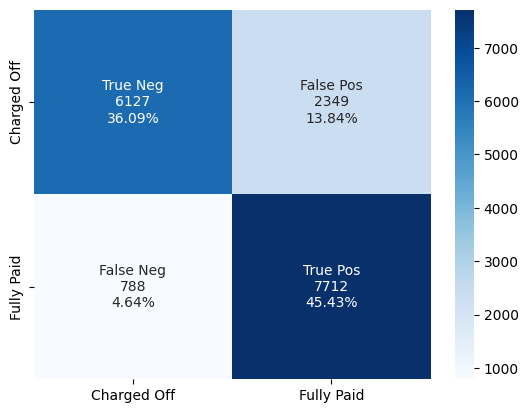

In [ ]:
from sklearn.ensemble import RandomForestClassifier
pipeline_rf = train_model(RandomForestClassifier, X_train, y_train, X_test, y_test)

In [ ]:
feature_df=pd.DataFrame({'feature':X_train.columns,'importance':pipeline_rf["classifier"].feature_importances_})
feature_df.sort_values(by='importance',ascending=False).head(10)


,feature,importance
2,Credit Score,0.203675
12,Maximum Open Credit,0.087220
0,Current Loan Amount,0.085688
7,Monthly Debt,0.084330
11,Current Credit Balance,0.084166
4,Years in current job,0.079766
8,Years of Credit History,0.079041
9,Number of Open Accounts,0.073283
3,Annual Income,0.070464
1,Term,0.044195


In [ ]:
# USING IQR for removing outliers

df_outlier_cleaned = new_df.copy()

q3, q1 = np.percentile(df_outlier_cleaned["Maximum Open Credit"], [75, 25])
IQR = q3 - q1

upper_bound = q3 + 1.5 * IQR
lower_bound = q1 - 1.5 * IQR
df_outlier_cleaned = df_outlier_cleaned[df_outlier_cleaned["Maximum Open Credit"] < upper_bound]
df_outlier_cleaned = df_outlier_cleaned[df_outlier_cleaned["Maximum Open Credit"] > lower_bound]

from sklearn.preprocessing import LabelEncoder

loan_status_label_encoder = LabelEncoder()
df_outlier_cleaned['Loan Status'] = loan_status_label_encoder.fit_transform(df_outlier_cleaned['Loan Status'])

term_label_encoder = LabelEncoder()
df_outlier_cleaned['Term'] = term_label_encoder.fit_transform(df_outlier_cleaned['Term'])

home_label_encoder = LabelEncoder()
df_outlier_cleaned['Home Ownership'] = home_label_encoder.fit_transform(df_outlier_cleaned['Home Ownership'])

purpose_label_encoder = LabelEncoder()
df_outlier_cleaned['Purpose'] = purpose_label_encoder.fit_transform(df_outlier_cleaned['Purpose'])


# dummy=pd.get_dummies(df_train['purpose'],prefix='purpose')
# df_train=pd.concat([df_train,dummy],axis=1)
# df_train.drop(['purpose'],axis=1,inplace=True)

from imblearn.over_sampling import SMOTE
x,y=SMOTE().fit_resample(df_outlier_cleaned.drop("Loan Status", axis=1), df_outlier_cleaned["Loan Status"])
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=25)


Model Score: 0.859453873365396
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.75      0.84     12654
           1       0.79      0.97      0.87     12505

    accuracy                           0.86     25159
   macro avg       0.88      0.86      0.86     25159
weighted avg       0.88      0.86      0.86     25159

Confusion Matrix



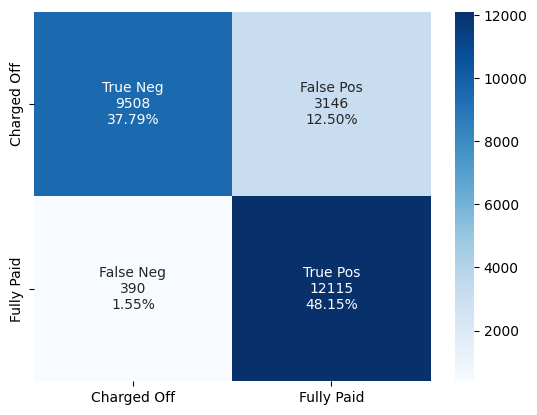

In [ ]:
pipeline_1 = train_model(XGBClassifier, X_train, y_train, X_test, y_test)

In [ ]:
feature_df=pd.DataFrame({'feature':X_train.columns,'importance':pipeline_1["classifier"].feature_importances_})
feature_df.sort_values(by='importance',ascending=False).head(10)


,feature,importance
1,Term,0.199836
2,Credit Score,0.176830
13,Bankruptcies,0.172259
4,Years in current job,0.136241
10,Number of Credit Problems,0.101943
9,Number of Open Accounts,0.061655
0,Current Loan Amount,0.059909
5,Home Ownership,0.025659
6,Purpose,0.020387
3,Annual Income,0.012219


Model Score: 0.847251480583489
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.79      0.84     12654
           1       0.81      0.91      0.86     12505

    accuracy                           0.85     25159
   macro avg       0.85      0.85      0.85     25159
weighted avg       0.85      0.85      0.85     25159

Confusion Matrix



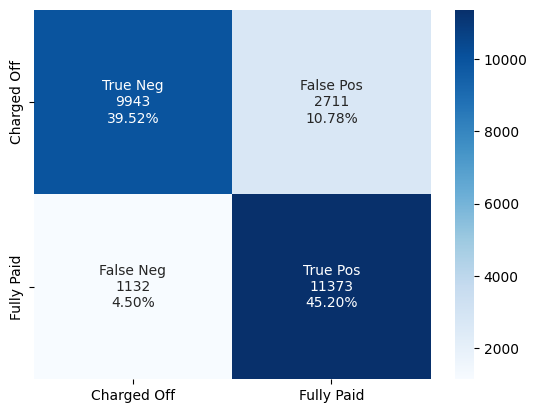

In [ ]:
pipeline_rf_1 = train_model(RandomForestClassifier, X_train, y_train, X_test, y_test)

In [ ]:
import joblib
joblib.dump(pipeline_1, "xgboost_pipeline.pkl")

['xgboost_pipeline.pkl']

In [ ]:
joblib.dump({
    "loan_status_label_encoder": loan_status_label_encoder, 
    "term_label_encoder": term_label_encoder,
    "home_label_encoder": home_label_encoder,
    "purpose_label_encoder": purpose_label_encoder
 }," label_encoder_dict.pkl"
)

[' label_encoder_dict.pkl']

In [ ]:
term_label_encoder.inverse_transform([1])[0]

'Short Term'

In [ ]:
home_label_encoder.classes_

array(['HaveMortgage', 'Home Mortgage', 'Own Home', 'Rent'], dtype=object)

In [ ]:
X_train.columns

Index(['Current Loan Amount', 'Term', 'Credit Score', 'Annual Income',
       'Years in current job', 'Home Ownership', 'Purpose', 'Monthly Debt',
       'Years of Credit History', 'Number of Open Accounts',
       'Number of Credit Problems', 'Current Credit Balance',
       'Maximum Open Credit', 'Bankruptcies', 'Tax Liens'],
      dtype='object')

In [ ]:
new_df["Tax Liens"].unique()

array([ 0.        ,  1.        ,  2.        ,  4.        ,  3.        ,
        6.        ,  5.        ,  0.02860453, 11.        , 15.        ,
        9.        ,  7.        , 10.        ])